# **Read CSV File**

In [ ]:
from google.colab import files
import pandas as pd

# Upload file
uploaded = files.upload()

Saving Thalassemia_Bangladesh_dataset.csv to Thalassemia_Bangladesh_dataset.csv


In [ ]:
# Read CSV file, preserve None/N/A as text
df = pd.read_csv('Thalassemia_Bangladesh_dataset.csv', keep_default_na=False)

# **Class Distribution Check**

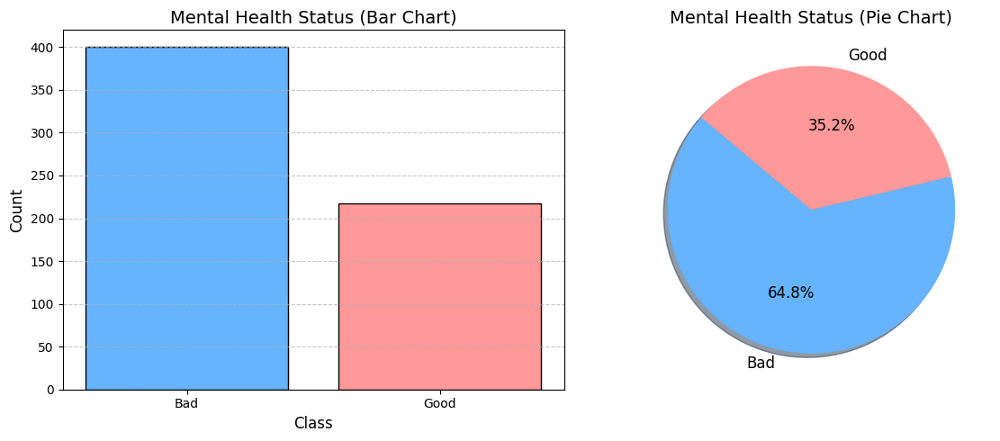

In [ ]:
import matplotlib.pyplot as plt

# Class distribution
counts = df['Mental_Health_Status'].value_counts()
labels = counts.index

colors = ['#66B3FF', '#FF9999']  # blue and pink

# Create figure with side-by-side subplots
fig, axs = plt.subplots(1, 2, figsize=(12,5))

# --- Bar Chart ---
axs[0].bar(labels, counts, color=colors[:len(labels)], edgecolor='black')
axs[0].set_xlabel("Class", fontsize=12)
axs[0].set_ylabel("Count", fontsize=12)
axs[0].set_title("Mental Health Status (Bar Chart)", fontsize=14)
axs[0].grid(axis='y', linestyle='--', alpha=0.7)

# --- Pie Chart ---
axs[1].pie(counts, labels=labels, autopct='%1.1f%%', colors=colors[:len(labels)], startangle=140, shadow=True, textprops={'fontsize':12})
axs[1].set_title("Mental Health Status (Pie Chart)", fontsize=14)

plt.tight_layout()
plt.show()

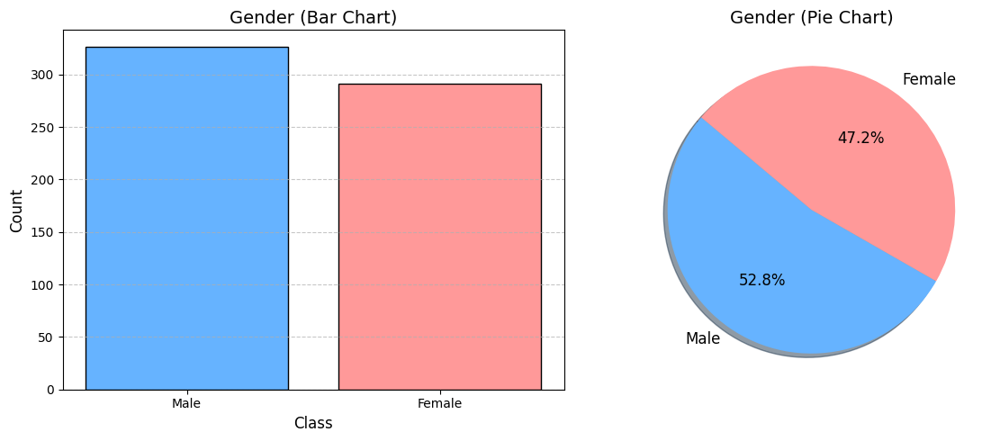

In [ ]:
import matplotlib.pyplot as plt

# Class distribution
counts = df['Gender'].value_counts()
labels = counts.index

colors = ['#66B3FF', '#FF9999']  # blue and pink

# Create figure with side-by-side subplots
fig, axs = plt.subplots(1, 2, figsize=(12,5))

# --- Bar Chart ---
axs[0].bar(labels, counts, color=colors[:len(labels)], edgecolor='black')
axs[0].set_xlabel("Class", fontsize=12)
axs[0].set_ylabel("Count", fontsize=12)
axs[0].set_title("Gender (Bar Chart)", fontsize=14)
axs[0].grid(axis='y', linestyle='--', alpha=0.7)

# --- Pie Chart ---
axs[1].pie(counts, labels=labels, autopct='%1.1f%%', colors=colors[:len(labels)], startangle=140, shadow=True, textprops={'fontsize':12})
axs[1].set_title("Gender (Pie Chart)", fontsize=14)

plt.tight_layout()
plt.show()

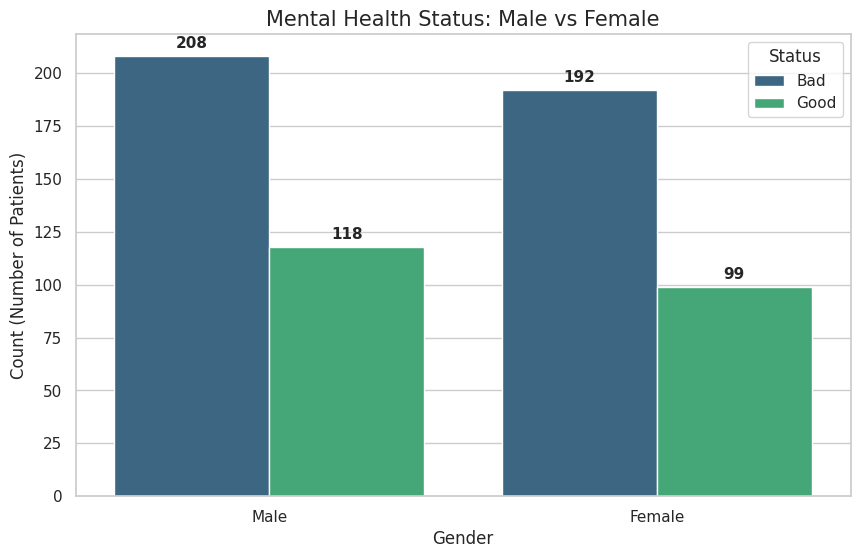

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set plot style
sns.set(style="whitegrid")

# Set figure size
plt.figure(figsize=(10, 6))

# Create the countplot
ax = sns.countplot(data=df, x='Gender', hue='Mental_Health_Status', palette='viridis')

# Title and axis labels
plt.title('Mental Health Status: Male vs Female', fontsize=15)
plt.xlabel('Gender', fontsize=12)
plt.ylabel('Count (Number of Patients)', fontsize=12)

# Add count labels on top of bars (ignore bars with 0 height)
for p in ax.patches:
    height = p.get_height()

    if height > 0:  # Avoid showing label for zero-height bars
        ax.annotate(f'{int(height)}',
                    (p.get_x() + p.get_width()/2., height),
                    ha='center', va='center',
                    xytext=(0, 9),
                    textcoords='offset points',
                    fontsize=11,
                    fontweight='bold')

# Show legend
plt.legend(title='Status', loc='upper right')

# Display the plot
plt.show()

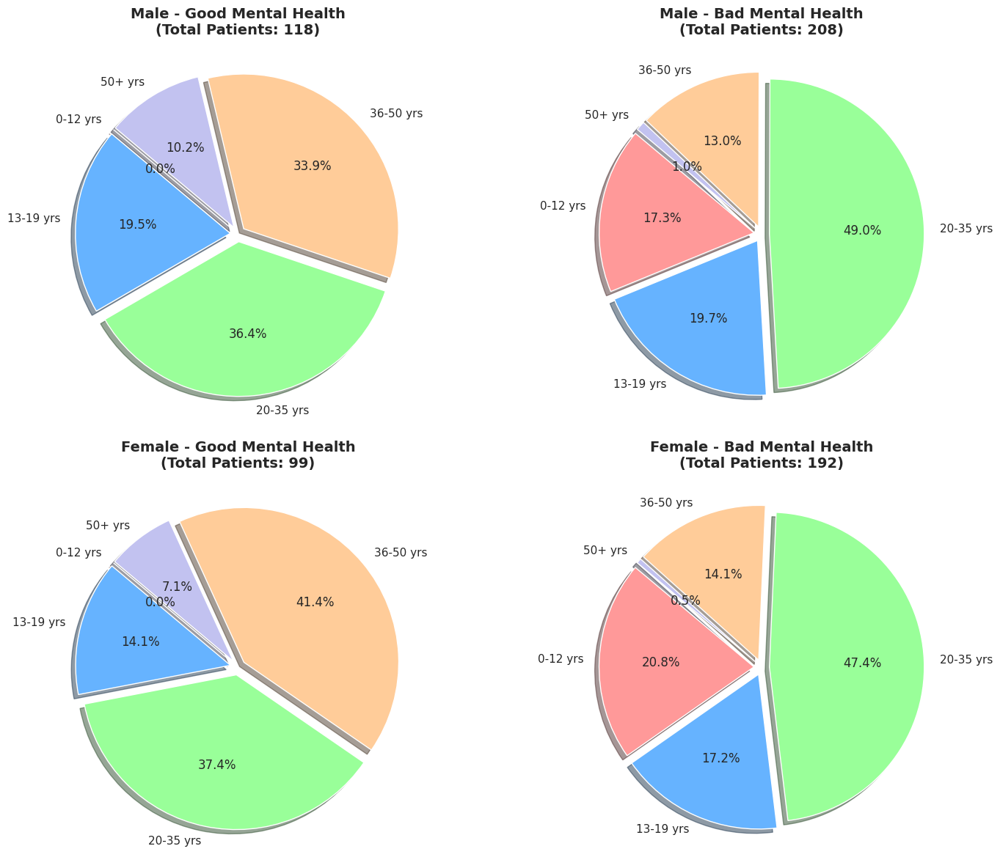

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

# 1. Divide age into groups (Age Binning)
bins = [0, 12, 19, 35, 50, 70]
labels = ['0-12 yrs', '13-19 yrs', '20-35 yrs', '36-50 yrs', '50+ yrs']
df['Age_Group'] = pd.cut(df['Current_Age'], bins=bins, labels=labels)

# 2. Visualization setup
genders = ['Male', 'Female']
statuses = ['Good', 'Bad']
fig, axes = plt.subplots(2, 2, figsize=(15, 12))
colors = ['#ff9999','#66b3ff','#99ff99','#ffcc99', '#c2c2f0']

idx = 0
for gender in genders:
    for status in statuses:
        row = idx // 2
        col = idx % 2

        # Filter the dataset based on specific gender and mental health status
        subset = df[(df['Gender'] == gender) & (df['Mental_Health_Status'] == status)]
        counts = subset['Age_Group'].value_counts().sort_index()

        # Create the pie chart
        if not counts.empty and counts.sum() > 0:
            axes[row, col].pie(counts, labels=counts.index, autopct='%1.1f%%',
                               startangle=140, colors=colors, shadow=True,
                               explode=[0.05]*len(counts))  # Slightly separate the slices
            axes[row, col].set_title(f'{gender} - {status} Mental Health\n(Total Patients: {len(subset)})',
                                     fontsize=14, fontweight='bold')
        else:
            axes[row, col].text(0.5, 0.5, 'No Data Available', ha='center', va='center')
            axes[row, col].set_title(f'{gender} - {status} Mental Health', fontsize=14)

        idx += 1

plt.tight_layout()
plt.show()

# **Check Missing Values**

In [ ]:
import numpy as np

# Columns where blank = missing
missing_cols = [
    'Self-Reported_Comorbidities'
]

# Replace blank cells ("") with NaN
for col in missing_cols:
    df[col] = df[col].replace("", np.nan)

In [ ]:
missing_values = df.isnull()

In [ ]:
total_missing = missing_values.sum()

In [ ]:
percentage_missing = (missing_values.sum() / len(df)) * 100

In [ ]:
print("Total Missing Values:\n", total_missing)
print("\nPercentage of Missing Values:\n", percentage_missing)

Total Missing Values:
 Patient_ID                               0
Current_Age                              0
Gender                                   0
Residence_Type                           0
Education_Level                          0
Monthly_Household_Income                 0
Travel_Time_to_Hospital (min)            0
School/Work_Impact                       0
Age_at_Diagnosis                         0
Thalassemia_Type                         0
Splenectomy_Status                       0
Self-Reported_Comorbidities            206
Pre-Transfusion_Hb (g/dL)                0
Serum_Ferritin (ng/mL)                   0
MCV (fL)                                 0
MCH (pg)                                 0
RDW (%)                                  0
Reticulocyte_Count (%)                   0
HbF_Percent (%)                          0
Transfusion_Frequency (units/month)      0
Iron_Chelation_Therapy                   0
Chelation_Adherence                      0
BMI (kg/m²)                    

In [ ]:
df.shape

(617, 25)

In [ ]:
df.isnull().sum()

,0
Patient_ID,0
Current_Age,0
Gender,0
Residence_Type,0
Education_Level,0
Monthly_Household_Income,0
Travel_Time_to_Hospital (min),0
School/Work_Impact,0
Age_at_Diagnosis,0
Thalassemia_Type,0


# **Handling Missing Column**

In [ ]:
# df = df.drop(['Self-Reported_Comorbidities'], axis=1)

# Step 1: Fill missing with 'None'
df['Self-Reported_Comorbidities'] = df['Self-Reported_Comorbidities'].fillna('None')

# Step 2: Create correct binary flag (has disease or not)
binary_flag = (df['Self-Reported_Comorbidities'] != 'None').astype(int)

# Step 3: Get original column index
col_index = df.columns.get_loc('Self-Reported_Comorbidities')

# Step 4: Drop original column
df = df.drop(columns=['Self-Reported_Comorbidities'])

# Step 5: Insert new column at same position
df.insert(col_index, 'Has_Comorbidity', binary_flag)

In [ ]:
df[['Patient_ID', 'Has_Comorbidity', 'Thalassemia_Type', 'Mental_Health_Status']].head(15)

,Patient_ID,Has_Comorbidity,Thalassemia_Type,Mental_Health_Status
0,1,1,Major,Bad
1,2,1,Major,Bad
2,3,0,Intermedia,Good
3,4,1,Intermedia,Good
4,5,0,Minor,Good
5,6,1,Major,Bad
6,7,1,Major,Bad
7,8,0,Intermedia,Good
8,9,1,Intermedia,Good
9,10,0,Minor,Good


In [ ]:
df.shape

(617, 25)

# **Check Duplicate Values**

In [ ]:
df.duplicated().sum()

np.int64(0)

In [ ]:
df[df.duplicated()]

,Patient_ID,Current_Age,Gender,Residence_Type,Education_Level,Monthly_Household_Income,Travel_Time_to_Hospital (min),School/Work_Impact,Age_at_Diagnosis,Thalassemia_Type,...,MCH (pg),RDW (%),Reticulocyte_Count (%),HbF_Percent (%),Transfusion_Frequency (units/month),Iron_Chelation_Therapy,Chelation_Adherence,BMI (kg/m²),Mental_Health_Status,Age_Group


In [ ]:
# Full duplicate check ignoring 'Patient_ID' and show as DataFrame
duplicate_rows = df[df.duplicated(subset=df.columns.drop('Patient_ID'), keep=False)]

# Display duplicates in DataFrame form
duplicate_rows_df = duplicate_rows.reset_index(drop=True)
print("Duplicate Rows (ignoring Patient_ID):")
print(duplicate_rows_df)

# Total duplicates count
print("\nTotal duplicates (ignoring Patient_ID):", len(duplicate_rows_df))

Duplicate Rows (ignoring Patient_ID):
   Patient_ID  Current_Age  Gender Residence_Type Education_Level  \
0           7           11  Female          Urban         Primary   
1           8           16    Male          Urban       Secondary   
2          11           16    Male          Urban       Secondary   
3          15           11  Female          Urban         Primary   

  Monthly_Household_Income  Travel_Time_to_Hospital (min) School/Work_Impact  \
0                   25,000                             35           Moderate   
1                   35,000                             20               Mild   
2                   35,000                             20               Mild   
3                   25,000                             35           Moderate   

   Age_at_Diagnosis Thalassemia_Type  ... MCH (pg)  RDW (%)  \
0               2.8            Major  ...     19.0       22   
1               6.5       Intermedia  ...     22.0       18   
2               6.5       

# **Handling Duplicate Values**

In [ ]:
df_clean = df.drop_duplicates(subset=df.columns.drop('Patient_ID'), keep='first')

In [ ]:
df=df_clean

In [ ]:
df.shape

(615, 25)

# **Check Unique Values in Each Column**

In [ ]:
cat_cols = df.select_dtypes(include=['object', 'category']).columns

for col in cat_cols:
    print(f"\nColumn: {col}")
    print(df[col].unique())


Column: Gender
['Male' 'Female']

Column: Residence_Type
['Rural' 'Urban']

Column: Education_Level
['None' 'Primary' 'Secondary' 'Graduate' 'Preschool' 'Postgraduate']

Column: Monthly_Household_Income
['25,000' '30,000' '45,000' '55,000' '40,000' '35,000' '20,000' '50,000'
 '65,000' '60,000' '70,000' '36,500' '30,500' '20,500' '15,000' '75,000'
 '10,000' '80,000' '85,000']

Column: School/Work_Impact
['High' 'Moderate' 'Mild' 'None' 'Low']

Column: Thalassemia_Type
['Major' 'Intermedia' 'Minor']

Column: Splenectomy_Status
['Yes' 'No']

Column: Iron_Chelation_Therapy
['DFX + DFP' 'DFX' 'DFP' 'None' 'DFX ']

Column: Chelation_Adherence
['Low' 'High' 'Medium' 'N/A']

Column: Mental_Health_Status
['Bad' 'Good']

Column: Age_Group
['0-12 yrs', '13-19 yrs', '20-35 yrs', '36-50 yrs', '50+ yrs']
Categories (5, object): ['0-12 yrs' < '13-19 yrs' < '20-35 yrs' < '36-50 yrs' < '50+ yrs']


In [ ]:
df = df.drop(['Patient_ID', 'Age_Group'], axis=1)

In [ ]:
df['Monthly_Household_Income'] = df['Monthly_Household_Income'].str.replace(',', '').astype(int)

In [ ]:
df.head(5)

,Current_Age,Gender,Residence_Type,Education_Level,Monthly_Household_Income,Travel_Time_to_Hospital (min),School/Work_Impact,Age_at_Diagnosis,Thalassemia_Type,Splenectomy_Status,...,MCV (fL),MCH (pg),RDW (%),Reticulocyte_Count (%),HbF_Percent (%),Transfusion_Frequency (units/month),Iron_Chelation_Therapy,Chelation_Adherence,BMI (kg/m²),Mental_Health_Status
0,4,Male,Rural,None,25000,90,High,1.5,Major,Yes,...,62,18.0,24,8.0,30.0,3.0,DFX + DFP,Low,14.2,Bad
1,12,Female,Urban,Primary,25000,40,Moderate,3.0,Major,No,...,66,20.0,22,6.0,25.0,2.5,DFX,High,15.8,Bad
2,17,Male,Urban,Secondary,30000,25,Mild,6.0,Intermedia,No,...,72,23.0,18,3.0,10.0,1.0,DFP,Medium,19.5,Good
3,25,Female,Urban,Graduate,45000,10,None,8.0,Intermedia,No,...,76,25.0,14,2.0,5.0,0.5,DFX,High,20.8,Good
4,28,Male,Urban,Graduate,55000,1600,None,20.0,Minor,No,...,82,28.0,12,1.0,1.5,0.0,None,N/A,23.4,Good


# **Statistical Analysis**

In [ ]:
# summary statistics of numerical columns
import numpy as np
df.describe(include=[np.number])

,Current_Age,Monthly_Household_Income,Travel_Time_to_Hospital (min),Age_at_Diagnosis,Has_Comorbidity,Pre-Transfusion_Hb (g/dL),Serum_Ferritin (ng/mL),MCV (fL),MCH (pg),RDW (%),Reticulocyte_Count (%),HbF_Percent (%),Transfusion_Frequency (units/month),BMI (kg/m²)
count,615.000000,615.000000,615.000000,615.000000,615.000000,615.000000,615.000000,615.000000,615.000000,615.000000,615.000000,615.000000,615.000000,615.000000
mean,27.147967,35923.577236,51.243902,9.934797,0.666667,10.588130,1519.141463,70.400000,22.460163,17.975610,4.856911,16.445528,2.271220,19.863902
std,12.242230,18735.185597,98.708793,9.578132,0.471788,3.310049,1605.776389,12.886728,6.945129,8.508344,4.268785,15.040011,2.588033,5.123685
min,2.000000,10000.000000,6.000000,0.500000,0.000000,3.600000,80.000000,43.000000,9.000000,5.000000,0.500000,1.000000,0.000000,7.100000
25%,18.000000,20000.000000,18.000000,4.000000,0.000000,6.950000,790.000000,63.000000,18.000000,13.000000,2.050000,6.000000,0.450000,14.550000
50%,26.000000,30000.000000,30.000000,6.000000,1.000000,10.800000,920.000000,69.000000,22.000000,16.000000,3.300000,12.000000,1.400000,20.900000
75%,36.000000,50000.000000,68.000000,8.550000,1.000000,12.800000,2900.000000,76.000000,27.000000,25.000000,8.500000,30.000000,3.550000,23.650000
max,60.000000,85000.000000,1600.000000,35.000000,1.000000,16.200000,10000.000000,93.000000,36.000000,42.000000,16.900000,64.000000,11.300000,29.300000


# **Feature Engineering**

In [ ]:
import pandas as pd
import numpy as np

def engineer_features(df):
    """
    Add clinically meaningful features for thalassemia mental health prediction.
    All features derived from existing columns without leakage.
    """
    df_new = df.copy()

    # Ensure Monthly_Household_Income is numeric (remove commas if any)
    if df_new['Monthly_Household_Income'].dtype == 'object':
        df_new['Monthly_Household_Income'] = df_new['Monthly_Household_Income'].str.replace(',', '').astype(float)

    # 1. Iron Overload Index (Ferritin / Hb)
    # Add small epsilon to avoid division by zero
    df_new['Iron_Overload_Index'] = df_new['Serum_Ferritin (ng/mL)'] / (df_new['Pre-Transfusion_Hb (g/dL)'] + 0.1)

    # 2. Approximate MCHC (MCH / MCV * 100)
    df_new['MCHC_approx'] = (df_new['MCH (pg)'] / df_new['MCV (fL)']) * 100

    # 3. Disease Duration (Current_Age - Age_at_Diagnosis)
    df_new['Disease_Duration'] = df_new['Current_Age'] - df_new['Age_at_Diagnosis']

    # 4. Severe Anemia Flag (Hb < 7 g/dL)
    df_new['Severe_Anemia_Flag'] = (df_new['Pre-Transfusion_Hb (g/dL)'] < 7).astype(int)

    # 5. Severe Iron Overload Flag (Ferritin > 2500 ng/mL)
    df_new['Severe_Iron_Overload_Flag'] = (df_new['Serum_Ferritin (ng/mL)'] > 2500).astype(int)

    # 6. Low Income Flag (Monthly_Household_Income < 30,000)
    df_new['Low_Income_Flag'] = (df_new['Monthly_Household_Income'] < 30000).astype(int)

    # 7. Pediatric Flag (Current_Age < 18)
    df_new['Pediatric_Flag'] = (df_new['Current_Age'] < 18).astype(int)

    # 8. Log-transformed Serum Ferritin (handles skewness)
    df_new['Log_Serum_Ferritin'] = np.log1p(df_new['Serum_Ferritin (ng/mL)'])

    # 9. Age group bins (optional, can be used as categorical)
    # df_new['Age_Group'] = pd.cut(df_new['Current_Age'], bins=[0,12,18,60,100], labels=['Child','Teen','Adult','Senior'])

    return df_new

# Apply the function to your dataframe
df = engineer_features(df)

# Now you can proceed with removing leaky columns and encoding.

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 615 entries, 0 to 616
Data columns (total 31 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   Current_Age                          615 non-null    int64  
 1   Gender                               615 non-null    object 
 2   Residence_Type                       615 non-null    object 
 3   Education_Level                      615 non-null    object 
 4   Monthly_Household_Income             615 non-null    int64  
 5   Travel_Time_to_Hospital (min)        615 non-null    int64  
 6   School/Work_Impact                   615 non-null    object 
 7   Age_at_Diagnosis                     615 non-null    float64
 8   Thalassemia_Type                     615 non-null    object 
 9   Splenectomy_Status                   615 non-null    object 
 10  Has_Comorbidity                      615 non-null    int64  
 11  Pre-Transfusion_Hb (g/dL)            

In [ ]:
# Move target column to the end
cols = [col for col in df.columns if col != 'Mental_Health_Status'] + ['Mental_Health_Status']
df = df[cols]

# **Encoding**

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 615 entries, 0 to 616
Data columns (total 31 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   Current_Age                          615 non-null    int64  
 1   Gender                               615 non-null    object 
 2   Residence_Type                       615 non-null    object 
 3   Education_Level                      615 non-null    object 
 4   Monthly_Household_Income             615 non-null    int64  
 5   Travel_Time_to_Hospital (min)        615 non-null    int64  
 6   School/Work_Impact                   615 non-null    object 
 7   Age_at_Diagnosis                     615 non-null    float64
 8   Thalassemia_Type                     615 non-null    object 
 9   Splenectomy_Status                   615 non-null    object 
 10  Has_Comorbidity                      615 non-null    int64  
 11  Pre-Transfusion_Hb (g/dL)            

In [ ]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder, OrdinalEncoder, OneHotEncoder

# Make a copy to avoid modifying original data
df_encoded = df.copy()

# 1. Clean Iron_Chelation_Therapy (remove trailing spaces)
df_encoded['Iron_Chelation_Therapy'] = df_encoded['Iron_Chelation_Therapy'].str.strip()

# 2. Binary/Label Encoding (no inherent order)
binary_cols = ['Gender', 'Residence_Type', 'Splenectomy_Status']
label_encoder = LabelEncoder()
for col in binary_cols:
    df_encoded[col] = label_encoder.fit_transform(df_encoded[col])

# 3. Handle Chelation_Adherence — separate N/A before ordinal encoding
df_encoded['No_Chelation'] = (df_encoded['Chelation_Adherence'] == 'N/A').astype(int)
df_encoded['Chelation_Adherence'] = df_encoded['Chelation_Adherence'].replace('N/A', 'Low')

# 4. Ordinal Encoding with correct category orders
ordinal_cols = {
    'Education_Level'    : ['None', 'Preschool', 'Primary', 'Secondary', 'Graduate', 'Postgraduate'],
    'School/Work_Impact' : ['None', 'Low', 'Mild', 'Moderate', 'High'],
    'Thalassemia_Type'   : ['Minor', 'Intermedia', 'Major'],
    'Chelation_Adherence': ['Low', 'Medium', 'High']
}

ordinal_encoder = OrdinalEncoder(categories=[ordinal_cols[col] for col in ordinal_cols])
ordinal_data = ordinal_encoder.fit_transform(df_encoded[list(ordinal_cols.keys())])

for i, col in enumerate(ordinal_cols.keys()):
    df_encoded[col] = ordinal_data[:, i]

# 5. One-Hot Encoding for Iron_Chelation_Therapy
onehot_encoder = OneHotEncoder(sparse_output=False, handle_unknown='ignore')
onehot_encoded = onehot_encoder.fit_transform(df_encoded[['Iron_Chelation_Therapy']])

onehot_df = pd.DataFrame(
    onehot_encoded,
    columns=onehot_encoder.get_feature_names_out(['Iron_Chelation_Therapy']),
    index=df_encoded.index
)

df_encoded = df_encoded.drop('Iron_Chelation_Therapy', axis=1)
df_encoded = pd.concat([df_encoded, onehot_df], axis=1)

# 6. Encode target column (Mental_Health_Status): Bad=0, Good=1
target_encoder = LabelEncoder()
df_encoded['Mental_Health_Status'] = target_encoder.fit_transform(df_encoded['Mental_Health_Status'])

# Final check
print("Shape:", df_encoded.shape)
print("\nDtypes:\n", df_encoded.dtypes)
print("\nPreview:\n", df_encoded.head())

Shape: (615, 35)

Dtypes:
 Current_Age                              int64
Gender                                   int64
Residence_Type                           int64
Education_Level                        float64
Monthly_Household_Income                 int64
Travel_Time_to_Hospital (min)            int64
School/Work_Impact                     float64
Age_at_Diagnosis                       float64
Thalassemia_Type                       float64
Splenectomy_Status                       int64
Has_Comorbidity                          int64
Pre-Transfusion_Hb (g/dL)              float64
Serum_Ferritin (ng/mL)                   int64
MCV (fL)                                 int64
MCH (pg)                               float64
RDW (%)                                  int64
Reticulocyte_Count (%)                 float64
HbF_Percent (%)                        float64
Transfusion_Frequency (units/month)    float64
Chelation_Adherence                    float64
BMI (kg/m²)                      

In [ ]:
df = df_encoded

In [ ]:
# from google.colab import files
# df.to_csv('encoded_dataset.csv', index=False)
# files.download('encoded_dataset.csv')

In [ ]:
# Identify one-hot columns (they typically start with 'Iron_Chelation_Therapy_')
onehot_cols = [col for col in df.columns if col.startswith('Iron_Chelation_Therapy_')]

# List of all other columns except the target and the one-hot ones
other_cols = [col for col in df.columns if col not in onehot_cols and col != 'Mental_Health_Status']

# Reorder: other columns, then one-hot columns, then target
df = df[other_cols + onehot_cols + ['Mental_Health_Status']]

# Verify the order
print(df.columns.tolist())

['Current_Age', 'Gender', 'Residence_Type', 'Education_Level', 'Monthly_Household_Income', 'Travel_Time_to_Hospital (min)', 'School/Work_Impact', 'Age_at_Diagnosis', 'Thalassemia_Type', 'Splenectomy_Status', 'Has_Comorbidity', 'Pre-Transfusion_Hb (g/dL)', 'Serum_Ferritin (ng/mL)', 'MCV (fL)', 'MCH (pg)', 'RDW (%)', 'Reticulocyte_Count (%)', 'HbF_Percent (%)', 'Transfusion_Frequency (units/month)', 'Chelation_Adherence', 'BMI (kg/m²)', 'Iron_Overload_Index', 'MCHC_approx', 'Disease_Duration', 'Severe_Anemia_Flag', 'Severe_Iron_Overload_Flag', 'Low_Income_Flag', 'Pediatric_Flag', 'Log_Serum_Ferritin', 'No_Chelation', 'Iron_Chelation_Therapy_DFP', 'Iron_Chelation_Therapy_DFX', 'Iron_Chelation_Therapy_DFX + DFP', 'Iron_Chelation_Therapy_None', 'Mental_Health_Status']


In [ ]:
df.shape

(615, 35)

In [ ]:
# Ensure target is numeric (it should be after encoding)
# Compute correlation with target
corr_with_target = df.corr()['Mental_Health_Status'].drop('Mental_Health_Status').sort_values(ascending=False)

# Display top 35 positive and top 35 negative correlations
print("=== Features most correlated with Mental_Health_Status (positive) ===\n")
print(corr_with_target.head(35).to_string(float_format="%.3f"))

print("\n=== Features most correlated with Mental_Health_Status (negative) ===\n")
print(corr_with_target.tail(35).to_string(float_format="%.3f"))

=== Features most correlated with Mental_Health_Status (positive) ===

MCV (fL)                               0.781
No_Chelation                           0.779
Age_at_Diagnosis                       0.752
MCH (pg)                               0.752
Monthly_Household_Income               0.741
Iron_Chelation_Therapy_None            0.733
Pre-Transfusion_Hb (g/dL)              0.655
BMI (kg/m²)                            0.631
MCHC_approx                            0.615
Current_Age                            0.391
Education_Level                        0.362
Residence_Type                         0.301
Gender                                 0.019
Travel_Time_to_Hospital (min)         -0.112
Pediatric_Flag                        -0.206
Iron_Chelation_Therapy_DFX + DFP      -0.226
Iron_Chelation_Therapy_DFP            -0.271
Disease_Duration                      -0.280
Iron_Chelation_Therapy_DFX            -0.297
Severe_Anemia_Flag                    -0.425
Iron_Overload_Index          

# **Data Visualization**

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# **Boxplot**

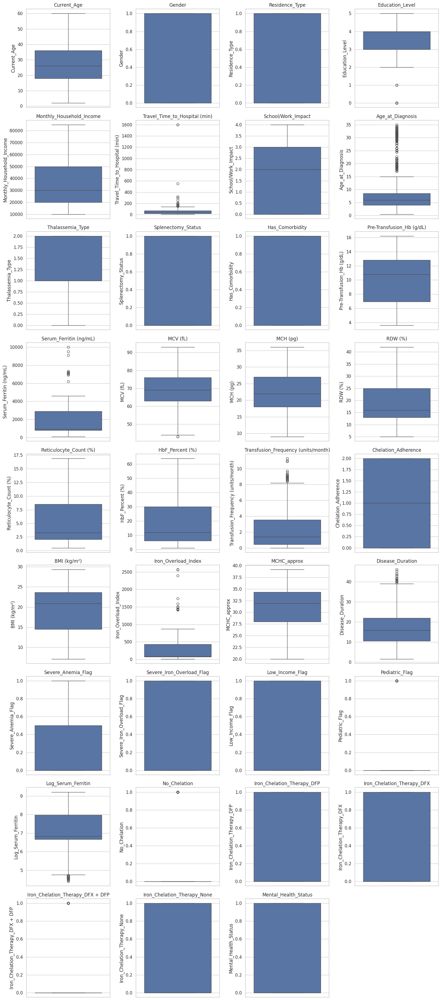

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import math

num_cols = df.select_dtypes(include=['int64','float64']).columns

n_cols = 4
n_rows = math.ceil(len(num_cols) / n_cols)

plt.figure(figsize=(16, 4*n_rows))

for i, col in enumerate(num_cols):
    plt.subplot(n_rows, n_cols, i+1)
    sns.boxplot(y=df[col])
    plt.title(col)

plt.tight_layout()
plt.show()

# **Histogram**

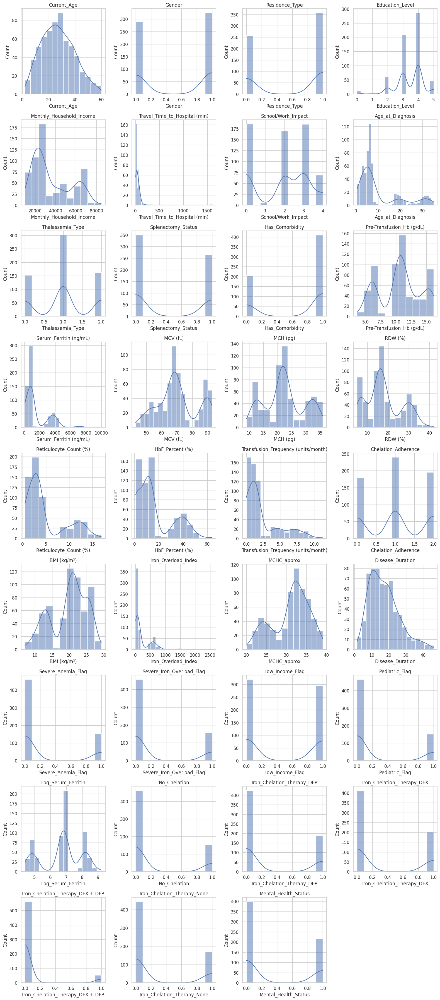

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import math

num_cols = df.select_dtypes(include=['int64','float64']).columns

n_cols = 4
n_rows = math.ceil(len(num_cols) / n_cols)

plt.figure(figsize=(16,4*n_rows))

for i, col in enumerate(num_cols):
    plt.subplot(n_rows, n_cols, i+1)
    sns.histplot(df[col], kde=True)
    plt.title(col)

plt.tight_layout()
plt.show()

# **Correlation Heatmap**

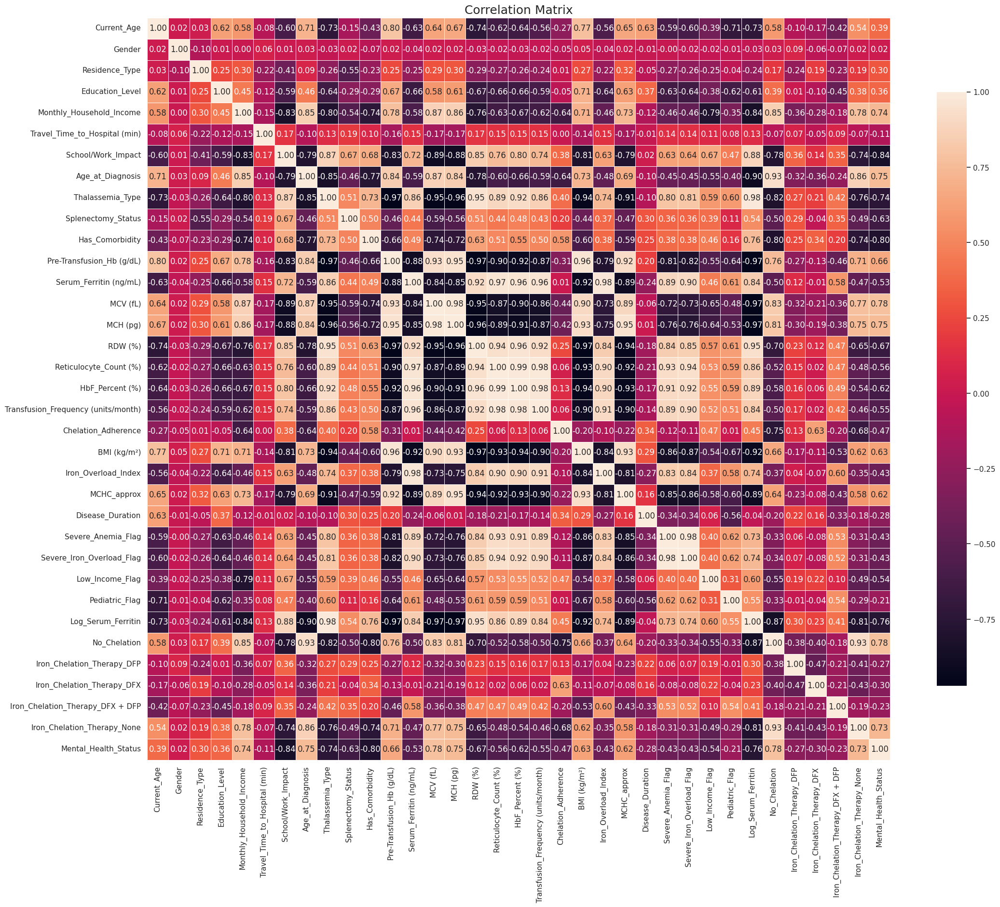

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(25,20))

corr = df.corr()

sns.heatmap(
    corr,
    annot=True,
    fmt=".2f",
    linewidths=0.5,
    square=True,
    cbar_kws={"shrink":0.8}
)

plt.title("Correlation Matrix", fontsize=18)
plt.show()

In [ ]:
df.shape

(615, 35)

# **Pairplot**

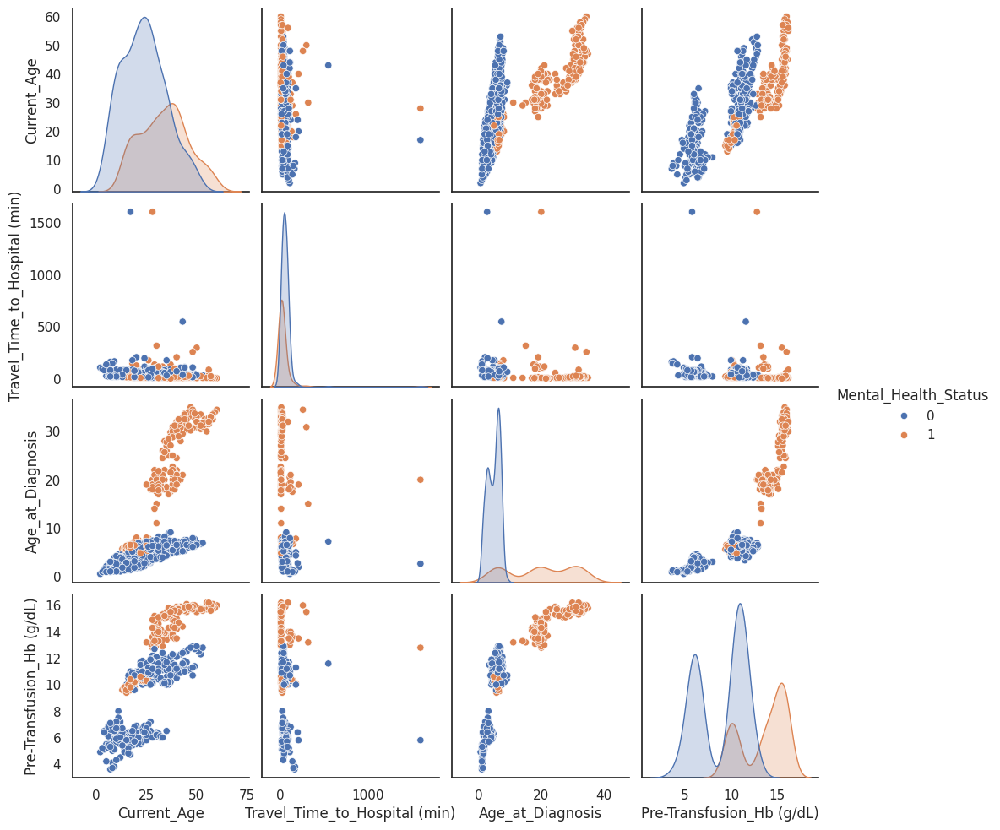

In [ ]:
import seaborn as sns
sns.set(style="white", color_codes=True)

import seaborn as sns

# Select specific columns
columns_to_include = ['Current_Age', 'Travel_Time_to_Hospital (min)', 'Age_at_Diagnosis', 'Pre-Transfusion_Hb (g/dL)']

# Plot
sns.pairplot(df.sample(n=615), vars=columns_to_include, hue="Mental_Health_Status")


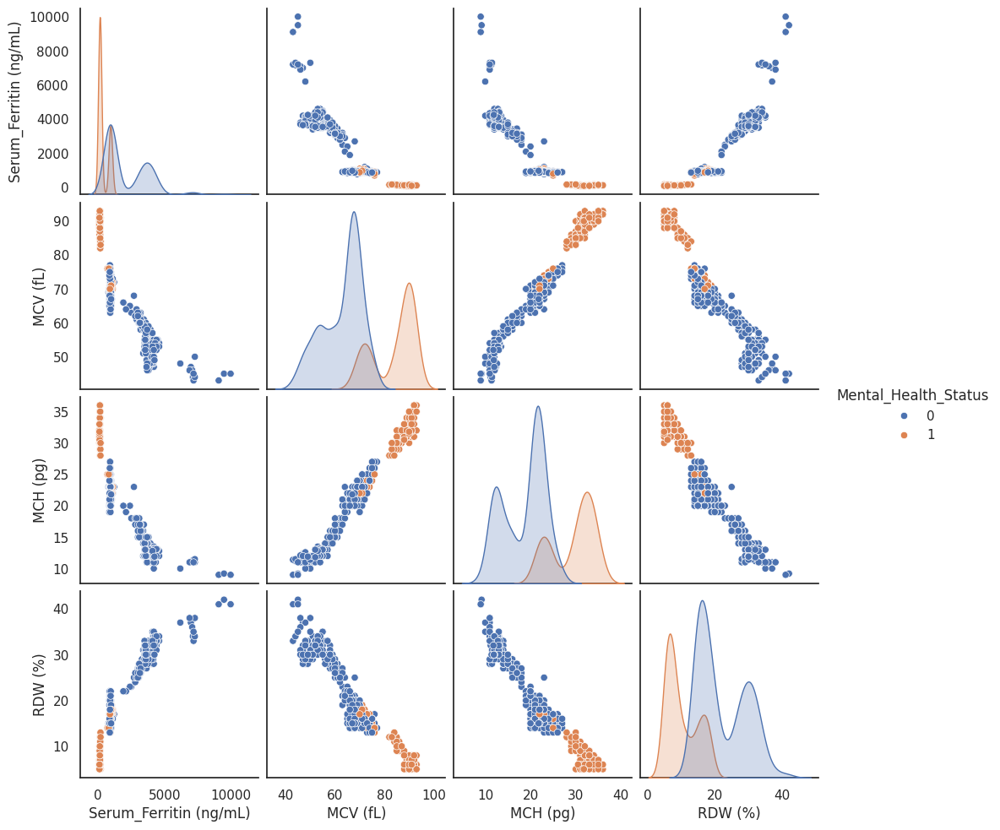

In [ ]:
import seaborn as sns
sns.set(style="white", color_codes=True)

import seaborn as sns

# Select specific columns
columns_to_include = ['Serum_Ferritin (ng/mL)', 'MCV (fL)', 'MCH (pg)', 'RDW (%)']

# Plot
sns.pairplot(df.sample(n=615), vars=columns_to_include, hue="Mental_Health_Status")


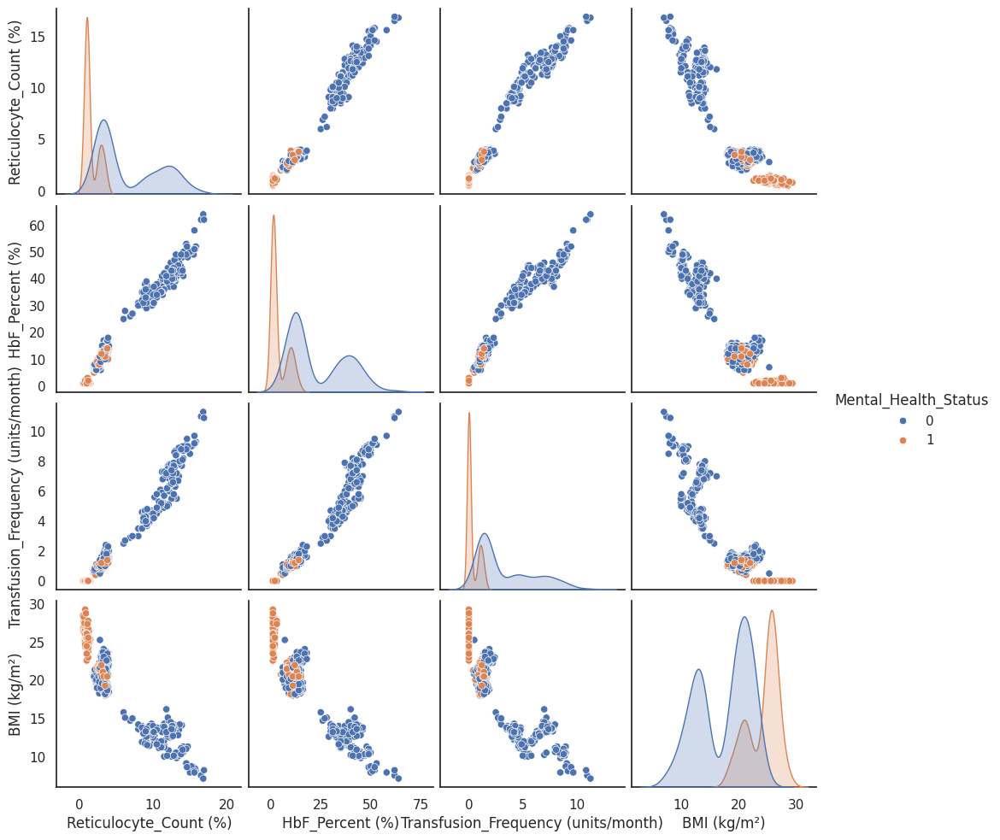

In [ ]:
import seaborn as sns
sns.set(style="white", color_codes=True)

import seaborn as sns

# Select specific columns
columns_to_include = ['Reticulocyte_Count (%)', 'HbF_Percent (%)', 'Transfusion_Frequency (units/month)', 'BMI (kg/m²)']

# Plot
sns.pairplot(df.sample(n=615), vars=columns_to_include, hue="Mental_Health_Status")


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 615 entries, 0 to 616
Data columns (total 35 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   Current_Age                          615 non-null    int64  
 1   Gender                               615 non-null    int64  
 2   Residence_Type                       615 non-null    int64  
 3   Education_Level                      615 non-null    float64
 4   Monthly_Household_Income             615 non-null    int64  
 5   Travel_Time_to_Hospital (min)        615 non-null    int64  
 6   School/Work_Impact                   615 non-null    float64
 7   Age_at_Diagnosis                     615 non-null    float64
 8   Thalassemia_Type                     615 non-null    float64
 9   Splenectomy_Status                   615 non-null    int64  
 10  Has_Comorbidity                      615 non-null    int64  
 11  Pre-Transfusion_Hb (g/dL)            

# **Remove Bad Features**

In [ ]:
cols_to_drop = [
    'School/Work_Impact',
    'Splenectomy_Status',
    'Iron_Chelation_Therapy_None',
    'No_Chelation',
    'Chelation_Adherence',
    'Transfusion_Frequency (units/month)',
    'Has_Comorbidity',
    'Iron_Chelation_Therapy_DFX + DFP',
    'Iron_Chelation_Therapy_DFP',
    'Iron_Chelation_Therapy_DFX'
]

df = df.drop(columns=[col for col in cols_to_drop if col in df.columns])

# cols_to_drop = [
#     'School/Work_Impact',
#     'Has_Comorbidity'
# ]

# df = df.drop(columns=[col for col in cols_to_drop if col in df.columns])

In [ ]:
df.shape

(615, 25)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 615 entries, 0 to 616
Data columns (total 25 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Current_Age                    615 non-null    int64  
 1   Gender                         615 non-null    int64  
 2   Residence_Type                 615 non-null    int64  
 3   Education_Level                615 non-null    float64
 4   Monthly_Household_Income       615 non-null    int64  
 5   Travel_Time_to_Hospital (min)  615 non-null    int64  
 6   Age_at_Diagnosis               615 non-null    float64
 7   Thalassemia_Type               615 non-null    float64
 8   Pre-Transfusion_Hb (g/dL)      615 non-null    float64
 9   Serum_Ferritin (ng/mL)         615 non-null    int64  
 10  MCV (fL)                       615 non-null    int64  
 11  MCH (pg)                       615 non-null    float64
 12  RDW (%)                        615 non-null    int64  


# **Train-Test Splitting**

In [ ]:
# segregating dataset into features i.e., X and target variables i.e., y
X = df.drop(['Mental_Health_Status'], axis=1)
y = df['Mental_Health_Status']

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.2, shuffle=True, random_state=42)

In [ ]:
# Repeated CV
from sklearn.model_selection import RepeatedStratifiedKFold

rskf = RepeatedStratifiedKFold(n_splits=5, n_repeats=10, random_state=42)

In [ ]:
## checking distribution of traget variable in train test split
print('Distribution of traget variable in training set')
print(y_train.value_counts())

print('Distribution of traget variable in test set')
print(y_test.value_counts())

Distribution of traget variable in training set
Mental_Health_Status
0    319
1    173
Name: count, dtype: int64
Distribution of traget variable in test set
Mental_Health_Status
0    80
1    43
Name: count, dtype: int64


# **Apply ML Algorithms with SMOTE**

In [ ]:
comp_ev = pd.DataFrame({
    'Model'                  : [],
    'Accuracy(cv)'           : [],
    'Precision(cv)'          : [],
    'Recall(cv)'             : [],
    'F1_score(cv)'           : [],
    'ROC(cv)'                : [],
    'Log_Loss(cv)'           : [],
    'mathew_corrcoef(cv)'    : [],
    'Accuracy(test)'         : [],
    'Precision(test)'        : [],
    'Recall(test)'           : [],
    'F1_score(test)'         : [],
    'ROC(test)'              : [],
    'Log_Loss(test)'         : [],
    'mathew_corrcoef(test)'  : []
})

# **LR**

In [ ]:
!pip install imbalanced-learn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 236.1/236.1 kB 9.5 MB/s eta 0:00:00


Fold-wise Results (Logistic Regression - WITH SMOTE):

Fold 1 → Acc:0.838 | Prec:0.822 | Recall:0.836 | F1:0.827 | ROC:0.951 | LogLoss:0.287 | MCC:0.658
Confusion Matrix (Fold 1):
[[54 10]
 [ 6 29]]

Fold 2 → Acc:0.909 | Prec:0.898 | Recall:0.930 | F1:0.905 | ROC:0.988 | LogLoss:0.257 | MCC:0.827
Confusion Matrix (Fold 2):
[[55  9]
 [ 0 35]]

Fold 3 → Acc:0.888 | Prec:0.874 | Recall:0.894 | F1:0.881 | ROC:0.975 | LogLoss:0.275 | MCC:0.768
Confusion Matrix (Fold 3):
[[55  8]
 [ 3 32]]

Fold 4 → Acc:0.929 | Prec:0.916 | Recall:0.932 | F1:0.923 | ROC:0.993 | LogLoss:0.205 | MCC:0.847
Confusion Matrix (Fold 4):
[[59  5]
 [ 2 32]]

Fold 5 → Acc:0.898 | Prec:0.883 | Recall:0.901 | F1:0.890 | ROC:0.983 | LogLoss:0.222 | MCC:0.784
Confusion Matrix (Fold 5):
[[57  7]
 [ 3 31]]


===== CV Fold Average Metrics (WITH SMOTE) =====
Accuracy: 0.8924 ± 0.0302
Precision: 0.8785 ± 0.0317
Recall: 0.8984 ± 0.0346
F1: 0.8853 ± 0.0322
ROC: 0.9779 ± 0.0147
LogLoss: 0.2490 ± 0.0313
MCC: 0.7767 ± 0.0660


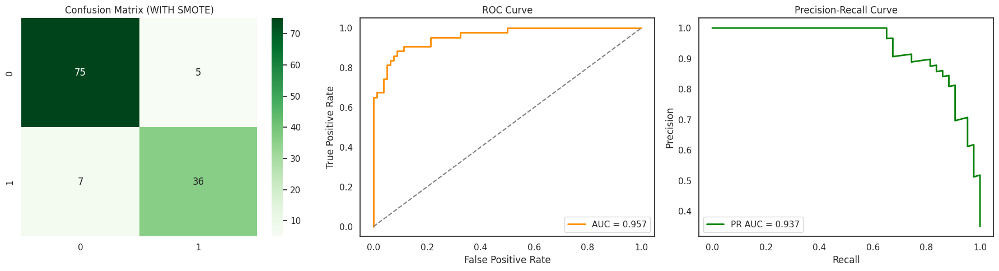



===== Repeated Stratified K-Fold CV (Logistic Regression with SMOTE) =====

===== Repeated CV Results (n_splits=5, n_repeats=10, total runs=50) =====
Accuracy: 0.8915 ± 0.0291
Precision: 0.8805 ± 0.0322
Recall: 0.8945 ± 0.0293
F1: 0.8839 ± 0.0304
ROC: 0.9781 ± 0.0101
LogLoss: 0.2481 ± 0.0250
MCC: 0.7746 ± 0.0587


,Model,Accuracy(cv),Precision(cv),Recall(cv),F1_score(cv),ROC(cv),Log_Loss(cv),mathew_corrcoef(cv),Accuracy(test),Precision(test),Recall(test),F1_score(test),ROC(test),Log_Loss(test),mathew_corrcoef(test)
0,LR (SMOTE),0.892352,0.878519,0.898444,0.88535,0.97791,0.248953,0.776687,0.902439,0.896341,0.887355,0.891534,0.956686,0.268969,0.783645


In [ ]:
from sklearn.model_selection import StratifiedKFold, RepeatedStratifiedKFold
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import (accuracy_score, precision_score, recall_score, f1_score,
                             roc_auc_score, log_loss, matthews_corrcoef, confusion_matrix,
                             roc_curve, auc, precision_recall_curve)
import numpy as np
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
from imblearn.over_sampling import SMOTE

# ============================================================
# PART 1: 5-Fold Stratified Cross-Validation
# (X_train, X_test = RAW / UNSCALED data)
# ============================================================

kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

fold_acc, fold_precision, fold_recall = [], [], []
fold_f1, fold_roc, fold_logloss, fold_mcc = [], [], [], []

# X_train ke numpy array e convert kore nilam (DataFrame hole .values dorkar)
X_train_arr = X_train.values if hasattr(X_train, "values") else X_train
y_train_arr = y_train.values if hasattr(y_train, "values") else y_train

print("Fold-wise Results (Logistic Regression - WITH SMOTE):\n")

for i, (train_idx, val_idx) in enumerate(kf.split(X_train_arr, y_train_arr), 1):

    X_tr, X_val = X_train_arr[train_idx], X_train_arr[val_idx]
    y_tr, y_val = y_train_arr[train_idx], y_train_arr[val_idx]

    # ---- Fold-wise MinMax Scaling (fit ONLY on training fold) ----
    scaler = MinMaxScaler()
    X_tr = scaler.fit_transform(X_tr)
    X_val = scaler.transform(X_val)

    # Apply SMOTE only to the training fold to avoid data leakage
    smote = SMOTE(random_state=42)
    X_tr_resampled, y_tr_resampled = smote.fit_resample(X_tr, y_tr)

    model = LogisticRegression(
        C=0.1,
        solver='liblinear',
        max_iter=500,
        random_state=42
    )

    model.fit(X_tr_resampled, y_tr_resampled)

    y_val_pred = model.predict(X_val)
    y_val_prob = model.predict_proba(X_val)[:, 1]

    acc = accuracy_score(y_val, y_val_pred)
    precision = precision_score(y_val, y_val_pred, average='macro')
    recall = recall_score(y_val, y_val_pred, average='macro')
    f1 = f1_score(y_val, y_val_pred, average='macro')
    roc = roc_auc_score(y_val, y_val_prob)
    logloss_val = log_loss(y_val, y_val_prob)
    mcc_val = matthews_corrcoef(y_val, y_val_pred)
    CM_val = confusion_matrix(y_val, y_val_pred)

    fold_acc.append(acc)
    fold_precision.append(precision)
    fold_recall.append(recall)
    fold_f1.append(f1)
    fold_roc.append(roc)
    fold_logloss.append(logloss_val)
    fold_mcc.append(mcc_val)

    print(
        f"Fold {i} → "
        f"Acc:{acc:.3f} | "
        f"Prec:{precision:.3f} | "
        f"Recall:{recall:.3f} | "
        f"F1:{f1:.3f} | "
        f"ROC:{roc:.3f} | "
        f"LogLoss:{logloss_val:.3f} | "
        f"MCC:{mcc_val:.3f}"
    )

    print(f"Confusion Matrix (Fold {i}):\n{CM_val}\n")


# ============================================================
# 5-Fold CV Average Metrics
# ============================================================

print("\n===== CV Fold Average Metrics (WITH SMOTE) =====")

print(f"Accuracy: {np.mean(fold_acc):.4f} ± {np.std(fold_acc):.4f}")
print(f"Precision: {np.mean(fold_precision):.4f} ± {np.std(fold_precision):.4f}")
print(f"Recall: {np.mean(fold_recall):.4f} ± {np.std(fold_recall):.4f}")
print(f"F1: {np.mean(fold_f1):.4f} ± {np.std(fold_f1):.4f}")
print(f"ROC: {np.mean(fold_roc):.4f} ± {np.std(fold_roc):.4f}")
print(f"LogLoss: {np.mean(fold_logloss):.4f} ± {np.std(fold_logloss):.4f}")
print(f"MCC: {np.mean(fold_mcc):.4f} ± {np.std(fold_mcc):.4f}")


# ============================================================
# Train the Final Model Using the Entire Training Set + SMOTE
# (Final scaler fit on FULL training set, then applied to test set)
# ============================================================

final_scaler = MinMaxScaler()
X_train_scaled_final = final_scaler.fit_transform(X_train_arr)

X_test_arr = X_test.values if hasattr(X_test, "values") else X_test
X_test_scaled_final = final_scaler.transform(X_test_arr)   # only transform, NOT fit

smote_final = SMOTE(random_state=42)

X_train_resampled, y_train_resampled = smote_final.fit_resample(
    X_train_scaled_final,
    y_train_arr
)

final_model = LogisticRegression(
    C=0.1,
    solver='liblinear',
    max_iter=500,
    random_state=42
)

final_model.fit(X_train_resampled, y_train_resampled)


# ============================================================
# CV Metrics (renamed from "train" to "CV" for clarity)
# ============================================================

acc_cv = np.mean(fold_acc)
precision_cv = np.mean(fold_precision)
recall_cv = np.mean(fold_recall)
f1_cv = np.mean(fold_f1)
roc_cv = np.mean(fold_roc)
logloss_cv = np.mean(fold_logloss)
mcc_cv = np.mean(fold_mcc)


# ============================================================
# Test Set Evaluation
# ============================================================

y_test_arr = y_test.values if hasattr(y_test, "values") else y_test

y_test_pred = final_model.predict(X_test_scaled_final)
y_test_prob = final_model.predict_proba(X_test_scaled_final)[:, 1]

acc_test = accuracy_score(y_test_arr, y_test_pred)
precision_test = precision_score(y_test_arr, y_test_pred, average='macro')
recall_test = recall_score(y_test_arr, y_test_pred, average='macro')
f1_test = f1_score(y_test_arr, y_test_pred, average='macro')
roc_test = roc_auc_score(y_test_arr, y_test_prob)
logloss_test = log_loss(y_test_arr, y_test_prob)
mcc_test = matthews_corrcoef(y_test_arr, y_test_pred)


# ============================================================
# Confusion Matrix, ROC Curve, and Precision-Recall Curve
# ============================================================

CM = confusion_matrix(y_test_arr, y_test_pred)

fpr, tpr, _ = roc_curve(y_test_arr, y_test_prob)
roc_auc = auc(fpr, tpr)

precision_vals, recall_vals, _ = precision_recall_curve(
    y_test_arr,
    y_test_prob
)

pr_auc = auc(recall_vals, precision_vals)


plt.figure(figsize=(18, 5))

# Confusion Matrix
plt.subplot(1, 3, 1)
sns.heatmap(CM, annot=True, fmt='d', cmap='Greens')
plt.title("Confusion Matrix (WITH SMOTE)")

# ROC Curve
plt.subplot(1, 3, 2)
plt.plot(fpr, tpr, label=f"AUC = {roc_auc:.3f}", color='darkorange', lw=2)
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend(loc="lower right")

# Precision-Recall Curve
plt.subplot(1, 3, 3)
plt.plot(recall_vals, precision_vals, label=f"PR AUC = {pr_auc:.3f}", color='green', lw=2)
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision-Recall Curve")
plt.legend(loc="lower left")

plt.tight_layout()
plt.show()


# ============================================================
# PART 2: Repeated Stratified K-Fold Cross-Validation
# Purpose: Assess the stability and robustness of the model
# across multiple train-validation splits.
# ============================================================

N_SPLITS = 5
N_REPEATS = 10

rskf = RepeatedStratifiedKFold(
    n_splits=N_SPLITS,
    n_repeats=N_REPEATS,
    random_state=42
)

rep_acc, rep_precision, rep_recall = [], [], []
rep_f1, rep_roc, rep_logloss, rep_mcc = [], [], [], []

print(
    "\n\n===== Repeated Stratified K-Fold CV "
    "(Logistic Regression with SMOTE) =====\n"
)

for i, (train_idx, val_idx) in enumerate(
    rskf.split(X_train_arr, y_train_arr),
    1
):

    X_tr, X_val = X_train_arr[train_idx], X_train_arr[val_idx]
    y_tr, y_val = y_train_arr[train_idx], y_train_arr[val_idx]

    # ---- Fold-wise MinMax Scaling (fit ONLY on training fold) ----
    scaler_rep = MinMaxScaler()
    X_tr = scaler_rep.fit_transform(X_tr)
    X_val = scaler_rep.transform(X_val)

    # Apply SMOTE only to the training fold to avoid data leakage
    smote_rep = SMOTE(random_state=42)

    X_tr_resampled, y_tr_resampled = smote_rep.fit_resample(
        X_tr,
        y_tr
    )

    model_rep = LogisticRegression(
        C=0.1,
        solver='liblinear',
        max_iter=500,
        random_state=42
    )

    model_rep.fit(
        X_tr_resampled,
        y_tr_resampled
    )

    y_val_pred = model_rep.predict(X_val)
    y_val_prob = model_rep.predict_proba(X_val)[:, 1]

    rep_acc.append(accuracy_score(y_val, y_val_pred))
    rep_precision.append(precision_score(y_val, y_val_pred, average='macro'))
    rep_recall.append(recall_score(y_val, y_val_pred, average='macro'))
    rep_f1.append(f1_score(y_val, y_val_pred, average='macro'))
    rep_roc.append(roc_auc_score(y_val, y_val_prob))
    rep_logloss.append(log_loss(y_val, y_val_prob))
    rep_mcc.append(matthews_corrcoef(y_val, y_val_pred))


# ============================================================
# Repeated CV Mean and Standard Deviation
# ============================================================

print(
    f"===== Repeated CV Results "
    f"(n_splits={N_SPLITS}, "
    f"n_repeats={N_REPEATS}, "
    f"total runs={N_SPLITS * N_REPEATS}) ====="
)

print(f"Accuracy: {np.mean(rep_acc):.4f} ± {np.std(rep_acc):.4f}")
print(f"Precision: {np.mean(rep_precision):.4f} ± {np.std(rep_precision):.4f}")
print(f"Recall: {np.mean(rep_recall):.4f} ± {np.std(rep_recall):.4f}")
print(f"F1: {np.mean(rep_f1):.4f} ± {np.std(rep_f1):.4f}")
print(f"ROC: {np.mean(rep_roc):.4f} ± {np.std(rep_roc):.4f}")
print(f"LogLoss: {np.mean(rep_logloss):.4f} ± {np.std(rep_logloss):.4f}")
print(f"MCC: {np.mean(rep_mcc):.4f} ± {np.std(rep_mcc):.4f}")


# ============================================================
# Store Repeated CV Results for Reporting
# These values are NOT added to comp_ev.
# ============================================================

acc_repcv = np.mean(rep_acc)
acc_repcv_std = np.std(rep_acc)

f1_repcv = np.mean(rep_f1)
f1_repcv_std = np.std(rep_f1)

mcc_repcv = np.mean(rep_mcc)
mcc_repcv_std = np.std(rep_mcc)


# ============================================================
# PART 3: Add Logistic Regression Results to comp_ev
# CV metrics (5-Fold) + Test metrics only.
# Repeated CV results are NOT added to the DataFrame.
# ============================================================

r = comp_ev.shape[0]
comp_ev.loc[r] = ['LR (SMOTE)', acc_cv, precision_cv, recall_cv, f1_cv, roc_cv,
                  logloss_cv, mcc_cv, acc_test, precision_test, recall_test, f1_test, roc_test,
                  logloss_test, mcc_test]

comp_ev = comp_ev.sort_values(by='Accuracy(test)', ascending=False).reset_index(drop=True)
comp_ev

# **ANN**

In [ ]:
!pip install -q tensorflow

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 572.9/572.9 MB 755.7 kB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.5/57.5 kB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.9/4.9 MB 111.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.5/24.5 MB 108.2 MB/s eta 0:00:00


/usr/local/lib/python3.13/dist-packages/jax/_src/cloud_tpu_init.py:86: UserWarning: Transparent hugepages are not enabled. TPU runtime startup and shutdown time should be significantly improved on TPU v5e and newer. If not already set, you may need to enable transparent hugepages in your VM image (sudo sh -c "echo always > /sys/kernel/mm/transparent_hugepage/enabled")
  warnings.warn(


Fold-wise Results (ANN - WITH SMOTE + fold-wise scaling):



/usr/local/lib/python3.13/dist-packages/keras/src/layers/core/dense.py:106: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Fold 1 → Acc:0.980 | Prec:0.985 | Recall:0.971 | F1:0.978 | ROC:0.998 | LogLoss:0.066 | MCC:0.956
Confusion Matrix (Fold 1):
[[64  0]
 [ 2 33]]



/usr/local/lib/python3.13/dist-packages/keras/src/layers/core/dense.py:106: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Fold 2 → Acc:0.980 | Prec:0.978 | Recall:0.978 | F1:0.978 | ROC:0.998 | LogLoss:0.053 | MCC:0.956
Confusion Matrix (Fold 2):
[[63  1]
 [ 1 34]]



/usr/local/lib/python3.13/dist-packages/keras/src/layers/core/dense.py:106: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.13/dist-packages/keras/src/layers/core/dense.py:106: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Fold 3 → Acc:0.969 | Prec:0.970 | Recall:0.963 | F1:0.966 | ROC:0.998 | LogLoss:0.062 | MCC:0.933
Confusion Matrix (Fold 3):
[[62  1]
 [ 2 33]]

Fold 4 → Acc:0.959 | Prec:0.947 | Recall:0.969 | F1:0.956 | ROC:0.998 | LogLoss:0.079 | MCC:0.916
Confusion Matrix (Fold 4):
[[60  4]
 [ 0 34]]



/usr/local/lib/python3.13/dist-packages/keras/src/layers/core/dense.py:106: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Fold 5 → Acc:1.000 | Prec:1.000 | Recall:1.000 | F1:1.000 | ROC:1.000 | LogLoss:0.007 | MCC:1.000
Confusion Matrix (Fold 5):
[[64  0]
 [ 0 34]]


===== CV Fold Average Metrics (ANN WITH SMOTE + fold-wise scaling) =====
Accuracy: 0.9776 ± 0.0136
Precision: 0.9760 ± 0.0174
Recall: 0.9763 ± 0.0127
F1: 0.9756 ± 0.0146
ROC: 0.9984 ± 0.0008
LogLoss: 0.0534 ± 0.0247
MCC: 0.9522 ± 0.0283


/usr/local/lib/python3.13/dist-packages/keras/src/layers/core/dense.py:106: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


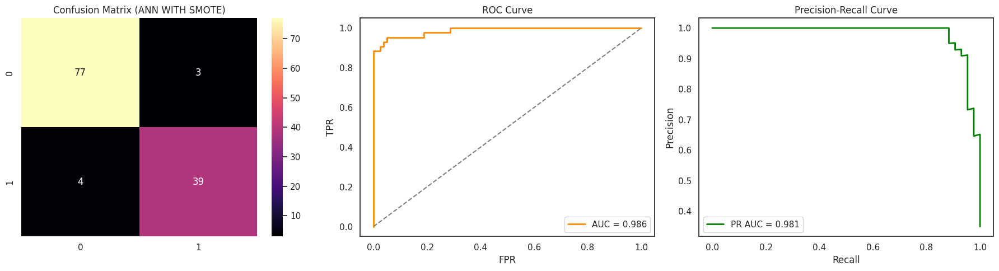


===== ANN Evaluation (WITH SMOTE) =====
Accuracy : 0.9431
Precision: 0.9396
Recall   : 0.9347
F1       : 0.9371
AUC (ROC): 0.9863
PR-AUC   : 0.9808
LogLoss  : 0.2792
MCC      : 0.8743


===== Repeated Stratified K-Fold CV (ANN with SMOTE + fold-wise scaling) =====



/usr/local/lib/python3.13/dist-packages/keras/src/layers/core/dense.py:106: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.13/dist-packages/keras/src/layers/core/dense.py:106: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.13/dist-packages/keras/src/layers/core/dense.py:106: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr

===== Repeated CV Results (n_splits=5, n_repeats=10, total runs=50) =====
Accuracy: 0.9771 ± 0.0158
Precision: 0.9759 ± 0.0185
Recall: 0.9744 ± 0.0168
F1: 0.9749 ± 0.0172
ROC: 0.9969 ± 0.0045
LogLoss: 0.0607 ± 0.0370
MCC: 0.9503 ± 0.0341


,Model,Accuracy(cv),Precision(cv),Recall(cv),F1_score(cv),ROC(cv),Log_Loss(cv),mathew_corrcoef(cv),Accuracy(test),Precision(test),Recall(test),F1_score(test),ROC(test),Log_Loss(test),mathew_corrcoef(test)
0,ANN (SMOTE),0.977633,0.975958,0.976314,0.975609,0.998374,0.053381,0.952199,0.943089,0.939594,0.934738,0.937084,0.986337,0.279230,0.874319
1,LR (SMOTE),0.892352,0.878519,0.898444,0.885350,0.977910,0.248953,0.776687,0.902439,0.896341,0.887355,0.891534,0.956686,0.268969,0.783645


In [ ]:
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import StratifiedKFold, RepeatedStratifiedKFold
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras import regularizers
import tensorflow as tf
import random

from sklearn.metrics import (accuracy_score, precision_score, recall_score, f1_score,
                             roc_auc_score, log_loss, matthews_corrcoef, confusion_matrix,
                             roc_curve, auc, precision_recall_curve)
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd


# ============================================================
# REPRODUCIBILITY
# ============================================================

SEED = 42

np.random.seed(SEED)
random.seed(SEED)
tf.keras.utils.set_random_seed(SEED)


# ============================================================
# PART 1: K-Fold Cross Validation WITH SMOTE + Fold-wise Scaling
# ============================================================

kf = StratifiedKFold(
    n_splits=5,
    shuffle=True,
    random_state=SEED
)

fold_acc, fold_precision, fold_recall = [], [], []
fold_f1, fold_roc, fold_logloss, fold_mcc = [], [], [], []

# Raw (unscaled) data – scaling will be done per fold
X_train_arr = X_train.values if hasattr(X_train, "values") else X_train
y_train_arr = y_train.values if hasattr(y_train, "values") else y_train

print("Fold-wise Results (ANN - WITH SMOTE + fold-wise scaling):\n")

for i, (train_idx, val_idx) in enumerate(
    kf.split(X_train_arr, y_train_arr), 1
):

    X_tr, X_val = X_train_arr[train_idx], X_train_arr[val_idx]
    y_tr, y_val = y_train_arr[train_idx], y_train_arr[val_idx]

    # ---- Fold-wise StandardScaler ----
    scaler = StandardScaler()

    X_tr = scaler.fit_transform(X_tr)
    X_val = scaler.transform(X_val)

    # ---- SMOTE only on training fold ----
    smote = SMOTE(random_state=SEED)

    X_tr_resampled, y_tr_resampled = smote.fit_resample(
        X_tr, y_tr
    )

    # ---- ANN Model ----
    model = Sequential([
        Dense(
            32,
            input_dim=X_tr.shape[1],
            activation='relu',
            kernel_regularizer=regularizers.l2(0.01)
        ),
        Dropout(0.2),
        Dense(16, activation='relu'),
        Dense(1, activation='sigmoid')
    ])

    model.compile(
        optimizer=Adam(learning_rate=0.001),
        loss='binary_crossentropy',
        metrics=['accuracy']
    )

    monitor = EarlyStopping(
        monitor='val_loss',
        patience=10,
        restore_best_weights=True
    )

    # ---- Train ----
    model.fit(
        X_tr_resampled,
        y_tr_resampled,
        validation_data=(X_val, y_val),
        epochs=150,
        batch_size=16,
        callbacks=[monitor],
        verbose=0
    )

    # ---- Validation prediction ----
    y_val_pred_prob = model.predict(
        X_val,
        verbose=0
    )

    y_val_pred = (
        y_val_pred_prob > 0.5
    ).astype(int)

    # ---- Metrics ----
    acc = accuracy_score(y_val, y_val_pred)
    prec = precision_score(y_val, y_val_pred, average='macro')
    rec = recall_score(y_val, y_val_pred, average='macro')
    f1 = f1_score(y_val, y_val_pred, average='macro')
    roc = roc_auc_score(y_val, y_val_pred_prob.ravel())
    ll = log_loss(y_val, y_val_pred_prob)
    mcc = matthews_corrcoef(y_val, y_val_pred)

    CM_val = confusion_matrix(
        y_val,
        y_val_pred
    )

    fold_acc.append(acc)
    fold_precision.append(prec)
    fold_recall.append(rec)
    fold_f1.append(f1)
    fold_roc.append(roc)
    fold_logloss.append(ll)
    fold_mcc.append(mcc)

    print(
        f"Fold {i} → "
        f"Acc:{acc:.3f} | "
        f"Prec:{prec:.3f} | "
        f"Recall:{rec:.3f} | "
        f"F1:{f1:.3f} | "
        f"ROC:{roc:.3f} | "
        f"LogLoss:{ll:.3f} | "
        f"MCC:{mcc:.3f}"
    )

    print(
        f"Confusion Matrix (Fold {i}):\n{CM_val}\n"
    )


# ============================================================
# Fold-wise averages
# ============================================================

print(
    "\n===== CV Fold Average Metrics "
    "(ANN WITH SMOTE + fold-wise scaling) ====="
)

print(
    f"Accuracy: {np.mean(fold_acc):.4f} ± "
    f"{np.std(fold_acc):.4f}"
)

print(
    f"Precision: {np.mean(fold_precision):.4f} ± "
    f"{np.std(fold_precision):.4f}"
)

print(
    f"Recall: {np.mean(fold_recall):.4f} ± "
    f"{np.std(fold_recall):.4f}"
)

print(
    f"F1: {np.mean(fold_f1):.4f} ± "
    f"{np.std(fold_f1):.4f}"
)

print(
    f"ROC: {np.mean(fold_roc):.4f} ± "
    f"{np.std(fold_roc):.4f}"
)

print(
    f"LogLoss: {np.mean(fold_logloss):.4f} ± "
    f"{np.std(fold_logloss):.4f}"
)

print(
    f"MCC: {np.mean(fold_mcc):.4f} ± "
    f"{np.std(fold_mcc):.4f}"
)


# ============================================================
# Train final model (WITH SMOTE)
# ============================================================

final_scaler = StandardScaler()

X_train_scaled_final = final_scaler.fit_transform(
    X_train_arr
)

X_test_arr = (
    X_test.values
    if hasattr(X_test, "values")
    else X_test
)

X_test_scaled_final = final_scaler.transform(
    X_test_arr
)


# ---- SMOTE on full training set ----

smote_final = SMOTE(
    random_state=SEED
)

X_train_resampled, y_train_resampled = (
    smote_final.fit_resample(
        X_train_scaled_final,
        y_train_arr
    )
)


# ---- Final ANN ----

final_model = Sequential([
    Dense(
        32,
        input_dim=X_train_scaled_final.shape[1],
        activation='relu',
        kernel_regularizer=regularizers.l2(0.01)
    ),
    Dropout(0.2),
    Dense(16, activation='relu'),
    Dense(1, activation='sigmoid')
])

final_model.compile(
    optimizer=Adam(learning_rate=0.001),
    loss='binary_crossentropy',
    metrics=['accuracy']
)

final_model.fit(
    X_train_resampled,
    y_train_resampled,
    epochs=150,
    batch_size=16,
    validation_split=0.1,
    callbacks=[
        EarlyStopping(
            patience=10,
            restore_best_weights=True
        )
    ],
    verbose=0
)


# ============================================================
# CV metrics
# ============================================================

acc_cv = np.mean(fold_acc)
precision_cv = np.mean(fold_precision)
recall_cv = np.mean(fold_recall)
f1_cv = np.mean(fold_f1)
roc_cv = np.mean(fold_roc)
logloss_cv = np.mean(fold_logloss)
mcc_cv = np.mean(fold_mcc)


# ============================================================
# Test metrics
# ============================================================

y_test_arr = (
    y_test.values
    if hasattr(y_test, "values")
    else y_test
)

y_test_pred_prob = final_model.predict(
    X_test_scaled_final,
    verbose=0
)

y_test_pred = (
    y_test_pred_prob > 0.5
).astype(int)


acc_test = accuracy_score(
    y_test_arr,
    y_test_pred
)

precision_test = precision_score(
    y_test_arr,
    y_test_pred,
    average='macro'
)

recall_test = recall_score(
    y_test_arr,
    y_test_pred,
    average='macro'
)

f1_test = f1_score(
    y_test_arr,
    y_test_pred,
    average='macro'
)

roc_test = roc_auc_score(
    y_test_arr,
    y_test_pred_prob.ravel()
)

logloss_test = log_loss(
    y_test_arr,
    y_test_pred_prob
)

mcc_test = matthews_corrcoef(
    y_test_arr,
    y_test_pred
)


# ============================================================
# Curves
# ============================================================

CM = confusion_matrix(
    y_test_arr,
    y_test_pred
)

fpr, tpr, _ = roc_curve(
    y_test_arr,
    y_test_pred_prob.ravel()
)

roc_auc = auc(
    fpr,
    tpr
)

precision_vals, recall_vals, _ = precision_recall_curve(
    y_test_arr,
    y_test_pred_prob.ravel()
)

pr_auc = auc(
    recall_vals,
    precision_vals
)


plt.figure(figsize=(18, 5))

plt.subplot(1, 3, 1)

sns.heatmap(
    CM,
    annot=True,
    fmt='d',
    cmap='magma'
)

plt.title("Confusion Matrix (ANN WITH SMOTE)")


plt.subplot(1, 3, 2)

plt.plot(
    fpr,
    tpr,
    label=f"AUC = {roc_auc:.3f}",
    color='darkorange',
    lw=2
)

plt.plot(
    [0, 1],
    [0, 1],
    linestyle='--',
    color='gray'
)

plt.xlabel("FPR")
plt.ylabel("TPR")
plt.title("ROC Curve")
plt.legend(loc="lower right")


plt.subplot(1, 3, 3)

plt.plot(
    recall_vals,
    precision_vals,
    label=f"PR AUC = {pr_auc:.3f}",
    color='green',
    lw=2
)

plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision-Recall Curve")
plt.legend(loc="lower left")

plt.tight_layout()
plt.show()


print("\n===== ANN Evaluation (WITH SMOTE) =====")
print(f"Accuracy : {acc_test:.4f}")
print(f"Precision: {precision_test:.4f}")
print(f"Recall   : {recall_test:.4f}")
print(f"F1       : {f1_test:.4f}")
print(f"AUC (ROC): {roc_auc:.4f}")
print(f"PR-AUC   : {pr_auc:.4f}")
print(f"LogLoss  : {logloss_test:.4f}")
print(f"MCC      : {mcc_test:.4f}")


# ============================================================
# PART 2: Repeated Stratified K-Fold Cross-Validation
# ============================================================

N_SPLITS = 5
N_REPEATS = 10

rskf = RepeatedStratifiedKFold(
    n_splits=N_SPLITS,
    n_repeats=N_REPEATS,
    random_state=SEED
)

rep_acc, rep_precision, rep_recall = [], [], []
rep_f1, rep_roc, rep_logloss, rep_mcc = [], [], [], []

print(
    "\n\n===== Repeated Stratified K-Fold CV "
    "(ANN with SMOTE + fold-wise scaling) =====\n"
)


for i, (train_idx, val_idx) in enumerate(
    rskf.split(X_train_arr, y_train_arr), 1
):

    X_tr, X_val = (
        X_train_arr[train_idx],
        X_train_arr[val_idx]
    )

    y_tr, y_val = (
        y_train_arr[train_idx],
        y_train_arr[val_idx]
    )


    # ---- Fold-wise StandardScaler ----

    scaler_rep = StandardScaler()

    X_tr = scaler_rep.fit_transform(X_tr)
    X_val = scaler_rep.transform(X_val)


    # ---- SMOTE only on training fold ----

    smote_rep = SMOTE(
        random_state=SEED
    )

    X_tr_resampled, y_tr_resampled = (
        smote_rep.fit_resample(
            X_tr,
            y_tr
        )
    )


    # ---- ANN ----

    model_rep = Sequential([
        Dense(
            32,
            input_dim=X_tr.shape[1],
            activation='relu',
            kernel_regularizer=regularizers.l2(0.01)
        ),
        Dropout(0.2),
        Dense(16, activation='relu'),
        Dense(1, activation='sigmoid')
    ])

    model_rep.compile(
        optimizer=Adam(learning_rate=0.001),
        loss='binary_crossentropy',
        metrics=['accuracy']
    )

    monitor_rep = EarlyStopping(
        monitor='val_loss',
        patience=10,
        restore_best_weights=True
    )


    model_rep.fit(
        X_tr_resampled,
        y_tr_resampled,
        validation_data=(X_val, y_val),
        epochs=150,
        batch_size=16,
        callbacks=[monitor_rep],
        verbose=0
    )


    y_val_pred_prob = model_rep.predict(
        X_val,
        verbose=0
    )

    y_val_pred = (
        y_val_pred_prob > 0.5
    ).astype(int)


    rep_acc.append(
        accuracy_score(y_val, y_val_pred)
    )

    rep_precision.append(
        precision_score(
            y_val,
            y_val_pred,
            average='macro'
        )
    )

    rep_recall.append(
        recall_score(
            y_val,
            y_val_pred,
            average='macro'
        )
    )

    rep_f1.append(
        f1_score(
            y_val,
            y_val_pred,
            average='macro'
        )
    )

    rep_roc.append(
        roc_auc_score(
            y_val,
            y_val_pred_prob.ravel()
        )
    )

    rep_logloss.append(
        log_loss(
            y_val,
            y_val_pred_prob
        )
    )

    rep_mcc.append(
        matthews_corrcoef(
            y_val,
            y_val_pred
        )
    )


# ============================================================
# Repeated CV Mean and Standard Deviation
# ============================================================

print(
    f"===== Repeated CV Results "
    f"(n_splits={N_SPLITS}, "
    f"n_repeats={N_REPEATS}, "
    f"total runs={N_SPLITS*N_REPEATS}) ====="
)

print(
    f"Accuracy: {np.mean(rep_acc):.4f} ± "
    f"{np.std(rep_acc):.4f}"
)

print(
    f"Precision: {np.mean(rep_precision):.4f} ± "
    f"{np.std(rep_precision):.4f}"
)

print(
    f"Recall: {np.mean(rep_recall):.4f} ± "
    f"{np.std(rep_recall):.4f}"
)

print(
    f"F1: {np.mean(rep_f1):.4f} ± "
    f"{np.std(rep_f1):.4f}"
)

print(
    f"ROC: {np.mean(rep_roc):.4f} ± "
    f"{np.std(rep_roc):.4f}"
)

print(
    f"LogLoss: {np.mean(rep_logloss):.4f} ± "
    f"{np.std(rep_logloss):.4f}"
)

print(
    f"MCC: {np.mean(rep_mcc):.4f} ± "
    f"{np.std(rep_mcc):.4f}"
)


# ============================================================
# PART 3: Append metrics to comparison DataFrame
# ============================================================

r = comp_ev.shape[0]
comp_ev.loc[r] = ['ANN (SMOTE)', acc_cv, precision_cv, recall_cv, f1_cv, roc_cv,
                  logloss_cv, mcc_cv, acc_test, precision_test, recall_test, f1_test, roc_test,
                  logloss_test, mcc_test]

comp_ev = comp_ev.sort_values(by='Accuracy(test)', ascending=False).reset_index(drop=True)
comp_ev

# **Feature Selection Algorithms**

## **Chi-Squared**

In [ ]:
from sklearn.feature_selection import SelectKBest, chi2
from sklearn.preprocessing import MinMaxScaler
import pandas as pd

# Scale to non-negative
scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train)

# Apply chi2
chi2_selector = SelectKBest(chi2, k='all')
chi2_selector.fit(X_train_scaled, y_train)

# Create DataFrame
chi2_scores = pd.DataFrame({
    'Feature': X_train.columns,
    'Score': chi2_selector.scores_,
    'PValue': chi2_selector.pvalues_
}).sort_values('Score', ascending=False)

# Select significant features
significant_features = chi2_scores[chi2_scores['PValue'] < 0.05]['Feature'].tolist()

print(chi2_scores.head(24))
print(f"\nSelected Features: {significant_features}")
print(f"Total: {len(significant_features)}")

                          Feature      Score        PValue
6                Age_at_Diagnosis  90.259999  2.088322e-21
21                Low_Income_Flag  85.375150  2.468028e-20
7                Thalassemia_Type  71.270860  3.114011e-17
20      Severe_Iron_Overload_Flag  67.789969  1.818724e-16
19             Severe_Anemia_Flag  65.620690  5.466190e-16
4        Monthly_Household_Income  51.481222  7.228520e-13
14                HbF_Percent (%)  44.434032  2.630740e-11
23             Log_Serum_Ferritin  41.752440  1.035929e-10
13         Reticulocyte_Count (%)  40.081904  2.435346e-10
11                       MCH (pg)  37.002968  1.179496e-09
10                       MCV (fL)  36.865863  1.265423e-09
12                        RDW (%)  34.717982  3.810952e-09
8       Pre-Transfusion_Hb (g/dL)  27.451230  1.611064e-07
9          Serum_Ferritin (ng/mL)  25.308099  4.886526e-07
22                 Pediatric_Flag  21.397735  3.732118e-06
15                    BMI (kg/m²)  18.670089  1.554012e-

# **ANOVA**

In [ ]:
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.preprocessing import StandardScaler
import pandas as pd

# Scale features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)

# Apply ANOVA
anova_selector = SelectKBest(f_classif, k='all')
anova_selector.fit(X_train_scaled, y_train)

# Create DataFrame
anova_scores = pd.DataFrame({
    'Feature': X_train.columns,
    'F_Score': anova_selector.scores_,
    'PValue': anova_selector.pvalues_
}).sort_values('F_Score', ascending=False)

# Select features
anova_selected = anova_scores[anova_scores['PValue'] < 0.05]['Feature'].tolist()

print(anova_scores.head(24))
print(f"\nSelected Features: {anova_selected}")
print(f"Total: {len(anova_selected)}")

                          Feature     F_Score         PValue
10                       MCV (fL)  820.803566  9.100566e-107
23             Log_Serum_Ferritin  740.555220  4.893038e-100
6                Age_at_Diagnosis  722.889077   1.699310e-98
11                       MCH (pg)  660.840243   6.695491e-93
4        Monthly_Household_Income  655.275426   2.199427e-92
7                Thalassemia_Type  632.532846   3.018337e-90
12                        RDW (%)  417.789919   1.305366e-67
8       Pre-Transfusion_Hb (g/dL)  394.474006   7.781453e-65
15                    BMI (kg/m²)  330.711493   7.482664e-57
14                HbF_Percent (%)  307.360136   9.013847e-54
17                    MCHC_approx  292.678908   8.685627e-52
21                Low_Income_Flag  243.751552   6.802853e-45
13         Reticulocyte_Count (%)  229.813200   7.618468e-43
9          Serum_Ferritin (ng/mL)  196.956318   7.518577e-38
20      Severe_Iron_Overload_Flag  111.015946   1.550704e-23
16            Iron_Overl

# **Mutual Information**

In [ ]:
from sklearn.feature_selection import mutual_info_classif
import pandas as pd
import numpy as np

# Stability improvement (average over multiple runs)
mi_runs = []
for i in range(5):
    mi = mutual_info_classif(X_train, y_train, random_state=i)
    mi_runs.append(mi)

mi_scores = np.mean(mi_runs, axis=0)

# Create DataFrame
mi_scores_df = pd.DataFrame({
    'Feature': X_train.columns,
    'MI_Score': mi_scores
}).sort_values('MI_Score', ascending=False)

# Select top-k features
k = 15
mi_selected = mi_scores_df.head(k)['Feature'].tolist()

print(mi_scores_df.head(24))
print(f"\nTop {k} MI Features: {mi_selected}")
print(f"Total selected features: {len(mi_selected)}")

                          Feature  MI_Score
8       Pre-Transfusion_Hb (g/dL)  0.517387
16            Iron_Overload_Index  0.479271
10                       MCV (fL)  0.472829
14                HbF_Percent (%)  0.452045
11                       MCH (pg)  0.442041
17                    MCHC_approx  0.430491
9          Serum_Ferritin (ng/mL)  0.417281
13         Reticulocyte_Count (%)  0.414861
23             Log_Serum_Ferritin  0.413751
12                        RDW (%)  0.408251
7                Thalassemia_Type  0.405537
6                Age_at_Diagnosis  0.396763
4        Monthly_Household_Income  0.372754
15                    BMI (kg/m²)  0.358300
5   Travel_Time_to_Hospital (min)  0.245153
21                Low_Income_Flag  0.183518
20      Severe_Iron_Overload_Flag  0.131885
18               Disease_Duration  0.131240
0                     Current_Age  0.127928
19             Severe_Anemia_Flag  0.125906
3                 Education_Level  0.098778
2                  Residence_Typ

# **Recursive Feature Elimination (RFE)**

In [ ]:
from sklearn.feature_selection import RFECV
from sklearn.model_selection import StratifiedKFold
from sklearn.ensemble import RandomForestClassifier

rfecv = RFECV(
    estimator=RandomForestClassifier(random_state=42, n_estimators=100),
    step=1,
    cv=StratifiedKFold(5, shuffle=True, random_state=42),
    scoring='f1',
    min_features_to_select=1,
    n_jobs=-1
)

rfecv.fit(X_train, y_train)

rfe_selected_features = X_train.columns[rfecv.support_].tolist()

print("Selected Features:", rfe_selected_features)
print("Optimal Number:", rfecv.n_features_)
print("Ranking:", dict(zip(X_train.columns, rfecv.ranking_)))

Selected Features: ['Current_Age', 'Gender', 'Residence_Type', 'Education_Level', 'Monthly_Household_Income', 'Travel_Time_to_Hospital (min)', 'Age_at_Diagnosis', 'Thalassemia_Type', 'Pre-Transfusion_Hb (g/dL)', 'Serum_Ferritin (ng/mL)', 'MCV (fL)', 'MCH (pg)', 'RDW (%)', 'Reticulocyte_Count (%)', 'HbF_Percent (%)', 'BMI (kg/m²)', 'Iron_Overload_Index', 'MCHC_approx', 'Disease_Duration', 'Severe_Anemia_Flag', 'Severe_Iron_Overload_Flag', 'Low_Income_Flag', 'Pediatric_Flag', 'Log_Serum_Ferritin']
Optimal Number: 24
Ranking: {'Current_Age': np.int64(1), 'Gender': np.int64(1), 'Residence_Type': np.int64(1), 'Education_Level': np.int64(1), 'Monthly_Household_Income': np.int64(1), 'Travel_Time_to_Hospital (min)': np.int64(1), 'Age_at_Diagnosis': np.int64(1), 'Thalassemia_Type': np.int64(1), 'Pre-Transfusion_Hb (g/dL)': np.int64(1), 'Serum_Ferritin (ng/mL)': np.int64(1), 'MCV (fL)': np.int64(1), 'MCH (pg)': np.int64(1), 'RDW (%)': np.int64(1), 'Reticulocyte_Count (%)': np.int64(1), 'HbF_Perc

# **RFE-MI (Hybrid Approach)**

In [ ]:
from sklearn.feature_selection import mutual_info_classif, RFECV
from sklearn.model_selection import StratifiedKFold
from sklearn.ensemble import RandomForestClassifier
import pandas as pd
import numpy as np

# Step 1: Stable MI scores
mi_runs = []
for i in range(5):
    mi = mutual_info_classif(X_train, y_train, random_state=i)
    mi_runs.append(mi)

mi_scores_all = np.mean(mi_runs, axis=0)

mi_scores_df = pd.DataFrame({
    'Feature': X_train.columns,
    'MI_Score': mi_scores_all
}).sort_values('MI_Score', ascending=False)

# Step 2: Select top-k features
top_k = 15
selected_mi_features = mi_scores_df.head(top_k)['Feature'].tolist()

X_train_mi_selected = X_train[selected_mi_features]

# Step 3: RFECV
rfecv_mi = RFECV(
    estimator=RandomForestClassifier(random_state=42, n_estimators=100),
    step=1,
    cv=StratifiedKFold(5, shuffle=True, random_state=42),
    scoring='f1',
    n_jobs=-1
)

rfecv_mi.fit(X_train_mi_selected, y_train)

# Step 4: Final features
rfe_mi_selected = X_train_mi_selected.columns[rfecv_mi.support_].tolist()

print("Final Selected Features:", rfe_mi_selected)
print("Optimal Number:", rfecv_mi.n_features_)

Final Selected Features: ['Pre-Transfusion_Hb (g/dL)', 'Iron_Overload_Index', 'MCV (fL)', 'HbF_Percent (%)', 'MCH (pg)', 'MCHC_approx', 'Serum_Ferritin (ng/mL)', 'Reticulocyte_Count (%)', 'Log_Serum_Ferritin', 'RDW (%)', 'Thalassemia_Type', 'Age_at_Diagnosis', 'Monthly_Household_Income', 'BMI (kg/m²)', 'Travel_Time_to_Hospital (min)']
Optimal Number: 15


# **Pearson correlation**

In [ ]:
!pip install -q statsmodels

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.3/10.3 MB 139.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.3/233.3 kB 16.1 MB/s eta 0:00:00


In [ ]:
import pandas as pd
from scipy.stats import pearsonr
from statsmodels.stats.multitest import multipletests

pearson_list = []

for feature in X_train.columns:
    corr, pval = pearsonr(X_train[feature], y_train)
    pearson_list.append({
        'Feature': feature,
        'Correlation': corr,
        'PValue': pval
    })

pearson_scores = pd.DataFrame(pearson_list)
pearson_scores['Abs_Correlation'] = pearson_scores['Correlation'].abs()

# Multiple testing correction
pearson_scores['Adj_PValue'] = multipletests(pearson_scores['PValue'], method='fdr_bh')[1]

# Sort by absolute correlation
pearson_scores = pearson_scores.sort_values('Abs_Correlation', ascending=False)

# Select significant features
pearson_selected = pearson_scores[pearson_scores['Adj_PValue'] < 0.05]['Feature'].tolist()

print("Top Pearson correlations:")
print(pearson_scores.head(22))
print(f"\nPearson-selected features: {pearson_selected}")
print(f"Total selected features: {len(pearson_selected)}")

Top Pearson correlations:
                      Feature  Correlation         PValue  Abs_Correlation  \
10                   MCV (fL)     0.791318  9.100566e-107         0.791318   
23         Log_Serum_Ferritin    -0.775761  4.893038e-100         0.775761   
6            Age_at_Diagnosis     0.772014   1.699310e-98         0.772014   
11                   MCH (pg)     0.757776   6.695491e-93         0.757776   
4    Monthly_Household_Income     0.756409   2.199427e-92         0.756409   
7            Thalassemia_Type    -0.750658   3.018337e-90         0.750658   
12                    RDW (%)    -0.678401   1.305366e-67         0.678401   
8   Pre-Transfusion_Hb (g/dL)     0.667831   7.781453e-65         0.667831   
15                BMI (kg/m²)     0.634789   7.482664e-57         0.634789   
14            HbF_Percent (%)    -0.620864   9.013847e-54         0.620864   
17                MCHC_approx     0.611510   8.685627e-52         0.611510   
21            Low_Income_Flag    -0.57

In [ ]:
pip install numpy pandas scikit-learn xgboost networkx

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.6/57.6 MB 24.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 252.4/252.4 MB 1.5 MB/s eta 0:00:00


# **AMSE-DFI Feature Selection**

In [ ]:
import numpy as np
import pandas as pd
from sklearn.feature_selection import mutual_info_classif
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.preprocessing import MinMaxScaler
import networkx as nx


# ------------------------------------------------
# AMSE-DFI Feature Selection
# ------------------------------------------------
def amse_dfi_feature_selection(X, y, keep_ratio=0.7, top_k=15):

    # -----------------------------
    # STEP 1 : Mutual Information
    # -----------------------------
    mi_scores = mutual_info_classif(X, y)

    mi_df = pd.DataFrame({
        "feature": X.columns,
        "mi_score": mi_scores
    })

    mi_df = mi_df.sort_values("mi_score", ascending=False)

    # Keep top % features
    k = int(len(mi_df) * keep_ratio)
    selected_mi_features = mi_df.head(k)["feature"].tolist()

    X_filtered = X[selected_mi_features]


    # -----------------------------
    # STEP 2 : Ensemble Importance
    # -----------------------------
    rf = RandomForestClassifier(
        n_estimators=200,
        random_state=42
    )

    rf.fit(X_filtered, y)
    rf_importance = rf.feature_importances_

    xgb = XGBClassifier(
        eval_metric='logloss',
        random_state=42
    )

    xgb.fit(X_filtered, y)
    xgb_importance = xgb.feature_importances_

    ensemble_importance = 0.5 * rf_importance + 0.5 * xgb_importance

    ensemble_df = pd.DataFrame({
        "feature": X_filtered.columns,
        "importance": ensemble_importance
    })


    # -----------------------------
    # STEP 3 : Feature Interaction
    # -----------------------------
    corr_matrix = X_filtered.corr()

    G = nx.Graph()

    for feature in X_filtered.columns:
        G.add_node(feature)

    for i in range(len(corr_matrix.columns)):
        for j in range(i + 1, len(corr_matrix.columns)):

            weight = abs(corr_matrix.iloc[i, j])

            if weight > 0.1:
                G.add_edge(
                    corr_matrix.columns[i],
                    corr_matrix.columns[j],
                    weight=weight
                )

    interaction_scores = {}

    for node in G.nodes():

        neighbors = list(G.neighbors(node))

        if len(neighbors) == 0:
            interaction_scores[node] = 0

        else:
            weights = [
                G[node][nbr]["weight"] for nbr in neighbors
            ]

            interaction_scores[node] = np.mean(weights)

    gat_df = pd.DataFrame({
        "feature": list(interaction_scores.keys()),
        "gat_score": list(interaction_scores.values())
    })


    # -----------------------------
    # STEP 4 : Combine Scores
    # -----------------------------
    merged = mi_df.merge(ensemble_df, on="feature")
    merged = merged.merge(gat_df, on="feature")

    scaler = MinMaxScaler()

    merged[["mi_score", "importance", "gat_score"]] = scaler.fit_transform(
        merged[["mi_score", "importance", "gat_score"]]
    )

    # Final Score
    merged["final_score"] = (
        0.3 * merged["mi_score"] +
        0.4 * merged["importance"] +
        0.3 * merged["gat_score"]
    )

    merged = merged.sort_values("final_score", ascending=False)

    selected_features = merged.head(top_k)["feature"].tolist()

    return selected_features, merged


# ------------------------------------------------
# Example Usage (WITH YOUR TRAIN DATA)
# ------------------------------------------------
selected_features, ranking = amse_dfi_feature_selection(
    X_train,
    y_train,
    top_k=24
)

print("Selected Features:")
print(selected_features)

print("\nTotal selected features:", len(selected_features))

print("\nFeature Ranking:")
print(ranking.head(24))

Selected Features:
['HbF_Percent (%)', 'MCV (fL)', 'Pre-Transfusion_Hb (g/dL)', 'Log_Serum_Ferritin', 'Serum_Ferritin (ng/mL)', 'MCH (pg)', 'Iron_Overload_Index', 'Reticulocyte_Count (%)', 'MCHC_approx', 'RDW (%)', 'Thalassemia_Type', 'Age_at_Diagnosis', 'BMI (kg/m²)', 'Monthly_Household_Income', 'Low_Income_Flag', 'Travel_Time_to_Hospital (min)']

Total selected features: 16

Feature Ranking:
                          feature  mi_score  importance  gat_score  \
2                 HbF_Percent (%)  0.857707    1.000000   0.967183   
3                        MCV (fL)  0.829207    0.527337   0.984849   
0       Pre-Transfusion_Hb (g/dL)  1.000000    0.131512   0.987540   
7              Log_Serum_Ferritin  0.732629    0.165816   0.981997   
5          Serum_Ferritin (ng/mL)  0.770159    0.185708   0.915517   
4                        MCH (pg)  0.808951    0.085630   0.998500   
1             Iron_Overload_Index  0.902358    0.152688   0.801599   
9          Reticulocyte_Count (%)  0.697856

# **Voating Technique with 7 Feature Selection Algorithms**

In [ ]:
import pandas as pd
from IPython.display import display

# ----------------------------
# 1. All features
# ----------------------------
all_features = X_train.columns.tolist()

# ----------------------------
# 2. Sob selected features from your code
# ----------------------------
pearson_features = pearson_selected
chi_features = significant_features
anova_features = anova_selected
mi_features = mi_selected
rfe_features = rfe_selected_features
rfe_mi_features = rfe_mi_selected
amse_features = selected_features

# ----------------------------
# 3. Create selection matrix
# ----------------------------
feature_matrix = pd.DataFrame({'Feature': all_features})

def mark_selected(feat, selected_list):
    return '✓' if feat in selected_list else '×'

feature_matrix['Pearson'] = feature_matrix['Feature'].apply(lambda x: mark_selected(x, pearson_features))
feature_matrix['Chi-Squared'] = feature_matrix['Feature'].apply(lambda x: mark_selected(x, chi_features))
feature_matrix['ANOVA'] = feature_matrix['Feature'].apply(lambda x: mark_selected(x, anova_features))
feature_matrix['MI'] = feature_matrix['Feature'].apply(lambda x: mark_selected(x, mi_features))
feature_matrix['RFE'] = feature_matrix['Feature'].apply(lambda x: mark_selected(x, rfe_features))
feature_matrix['RFE-MI'] = feature_matrix['Feature'].apply(lambda x: mark_selected(x, rfe_mi_features))
feature_matrix['AMSE-DFI'] = feature_matrix['Feature'].apply(lambda x: mark_selected(x, amse_features))

# ----------------------------
# 4. Add vote count column
# ----------------------------
algo_columns = ['Pearson','Chi-Squared','ANOVA','MI','RFE','RFE-MI','AMSE-DFI']
feature_matrix['Vote'] = feature_matrix[algo_columns].apply(lambda row: sum([1 if v=='✓' else 0 for v in row]), axis=1)

# ----------------------------
# 5. Sort by Vote descending & Feature name
# ----------------------------
feature_matrix = feature_matrix.sort_values(['Vote','Feature'], ascending=[False, True]).reset_index(drop=True)

# ----------------------------
# 6. Display in table format
# ----------------------------
# Using IPython.display for nicer DataFrame in Jupyter/Colab
display(feature_matrix)

,Feature,Pearson,Chi-Squared,ANOVA,MI,RFE,RFE-MI,AMSE-DFI,Vote
0,Age_at_Diagnosis,✓,✓,✓,✓,✓,✓,✓,7
1,BMI (kg/m²),✓,✓,✓,✓,✓,✓,✓,7
2,HbF_Percent (%),✓,✓,✓,✓,✓,✓,✓,7
3,Iron_Overload_Index,✓,✓,✓,✓,✓,✓,✓,7
4,Log_Serum_Ferritin,✓,✓,✓,✓,✓,✓,✓,7
5,MCH (pg),✓,✓,✓,✓,✓,✓,✓,7
6,MCHC_approx,✓,✓,✓,✓,✓,✓,✓,7
7,MCV (fL),✓,✓,✓,✓,✓,✓,✓,7
8,Monthly_Household_Income,✓,✓,✓,✓,✓,✓,✓,7
9,Pre-Transfusion_Hb (g/dL),✓,✓,✓,✓,✓,✓,✓,7


# **Apply ML Algorithms with Top 14 Selected Features**

In [ ]:
# segregating dataset into features i.e., X and target variables i.e., y
X = df.drop(['Mental_Health_Status'], axis=1)
y = df['Mental_Health_Status']

In [ ]:
top_14 = [
    'Age_at_Diagnosis',
    'BMI (kg/m²)',
    'HbF_Percent (%)',
    'Iron_Overload_Index',
    'Log_Serum_Ferritin',
    'MCH (pg)',
    'MCHC_approx',
    'MCV (fL)',
    'Monthly_Household_Income',
    'Pre-Transfusion_Hb (g/dL)',
    'RDW (%)',
    'Reticulocyte_Count (%)',
    'Serum_Ferritin (ng/mL)',
    'Thalassemia_Type'
]

In [ ]:
# subset of X with MI features
X_fs = X[top_14]

In [ ]:
print("Total features in X:", len(X.columns))
print("Top 14 selected:", len(top_14))

Total features in X: 24
Top 14 selected: 14


In [ ]:
# Selected features subset (X_fs)
X_fs = X[top_14]

X_train, X_test, y_train, y_test = train_test_split(X_fs, y, stratify=y, test_size=0.2, shuffle=True, random_state=42)

# Repeated CV
from sklearn.model_selection import RepeatedStratifiedKFold

rskf = RepeatedStratifiedKFold(n_splits=5, n_repeats=10, random_state=42)

# checking distribution
print('Distribution of target variable in training set')
print(y_train.value_counts())

print('Distribution of target variable in test set')
print(y_test.value_counts())

Distribution of target variable in training set
Mental_Health_Status
0    319
1    173
Name: count, dtype: int64
Distribution of target variable in test set
Mental_Health_Status
0    80
1    43
Name: count, dtype: int64


In [ ]:
comp_ev = pd.DataFrame({
    'Model'                  : [],
    'Accuracy(cv)'           : [],
    'Precision(cv)'          : [],
    'Recall(cv)'             : [],
    'F1_score(cv)'           : [],
    'ROC(cv)'                : [],
    'Log_Loss(cv)'           : [],
    'mathew_corrcoef(cv)'    : [],
    'Accuracy(test)'         : [],
    'Precision(test)'        : [],
    'Recall(test)'           : [],
    'F1_score(test)'         : [],
    'ROC(test)'              : [],
    'Log_Loss(test)'         : [],
    'mathew_corrcoef(test)'  : []
})

# **ANN**

Fold-wise Results (ANN - WITH SMOTE + fold-wise scaling):



/usr/local/lib/python3.13/dist-packages/keras/src/layers/core/dense.py:106: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Fold 1 → Acc:0.949 | Prec:0.955 | Recall:0.935 | F1:0.944 | ROC:0.996 | LogLoss:0.090 | MCC:0.889
Confusion Matrix (Fold 1):
[[63  1]
 [ 4 31]]



/usr/local/lib/python3.13/dist-packages/keras/src/layers/core/dense.py:106: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Fold 2 → Acc:0.960 | Prec:0.956 | Recall:0.956 | F1:0.956 | ROC:0.996 | LogLoss:0.073 | MCC:0.912
Confusion Matrix (Fold 2):
[[62  2]
 [ 2 33]]



/usr/local/lib/python3.13/dist-packages/keras/src/layers/core/dense.py:106: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Fold 3 → Acc:1.000 | Prec:1.000 | Recall:1.000 | F1:1.000 | ROC:1.000 | LogLoss:0.026 | MCC:1.000
Confusion Matrix (Fold 3):
[[63  0]
 [ 0 35]]



/usr/local/lib/python3.13/dist-packages/keras/src/layers/core/dense.py:106: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Fold 4 → Acc:0.980 | Prec:0.972 | Recall:0.984 | F1:0.978 | ROC:0.998 | LogLoss:0.087 | MCC:0.957
Confusion Matrix (Fold 4):
[[62  2]
 [ 0 34]]



/usr/local/lib/python3.13/dist-packages/keras/src/layers/core/dense.py:106: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Fold 5 → Acc:1.000 | Prec:1.000 | Recall:1.000 | F1:1.000 | ROC:1.000 | LogLoss:0.022 | MCC:1.000
Confusion Matrix (Fold 5):
[[64  0]
 [ 0 34]]


===== CV Fold Average Metrics (ANN WITH SMOTE + fold-wise scaling) =====
Accuracy: 0.9777 ± 0.0206
Precision: 0.9765 ± 0.0202
Recall: 0.9750 ± 0.0257
F1: 0.9754 ± 0.0229
ROC: 0.9980 ± 0.0017
LogLoss: 0.0596 ± 0.0297
MCC: 0.9515 ± 0.0451


/usr/local/lib/python3.13/dist-packages/keras/src/layers/core/dense.py:106: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


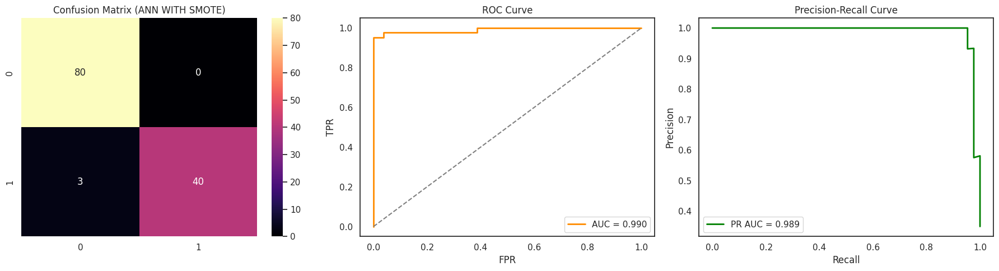


===== ANN Evaluation (WITH SMOTE) =====
Accuracy : 0.9756
Precision: 0.9819
Recall   : 0.9651
F1       : 0.9727
AUC (ROC): 0.9901
PR-AUC   : 0.9886
LogLoss  : 0.1204
MCC      : 0.9469


===== Repeated Stratified K-Fold CV (ANN with SMOTE + fold-wise scaling) =====



/usr/local/lib/python3.13/dist-packages/keras/src/layers/core/dense.py:106: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.13/dist-packages/keras/src/layers/core/dense.py:106: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.13/dist-packages/keras/src/layers/core/dense.py:106: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr

===== Repeated CV Results (n_splits=5, n_repeats=10, total runs=50) =====
Accuracy: 0.9779 ± 0.0152
Precision: 0.9755 ± 0.0178
Recall: 0.9767 ± 0.0159
F1: 0.9758 ± 0.0165
ROC: 0.9972 ± 0.0025
LogLoss: 0.0642 ± 0.0279
MCC: 0.9521 ± 0.0327


,Model,Accuracy(cv),Precision(cv),Recall(cv),F1_score(cv),ROC(cv),Log_Loss(cv),mathew_corrcoef(cv),Accuracy(test),Precision(test),Recall(test),F1_score(test),ROC(test),Log_Loss(test),mathew_corrcoef(test)
0,ANN (SMOTE),0.977737,0.97651,0.975045,0.975437,0.998023,0.0596,0.951497,0.97561,0.981928,0.965116,0.972725,0.990116,0.120355,0.946895


In [ ]:
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import StratifiedKFold, RepeatedStratifiedKFold
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras import regularizers
import tensorflow as tf
import random

from sklearn.metrics import (accuracy_score, precision_score, recall_score, f1_score,
                             roc_auc_score, log_loss, matthews_corrcoef, confusion_matrix,
                             roc_curve, auc, precision_recall_curve)
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd


# ============================================================
# REPRODUCIBILITY
# ============================================================

SEED = 42

np.random.seed(SEED)
random.seed(SEED)
tf.keras.utils.set_random_seed(SEED)


# ============================================================
# PART 1: K-Fold Cross Validation WITH SMOTE + Fold-wise Scaling
# ============================================================

kf = StratifiedKFold(
    n_splits=5,
    shuffle=True,
    random_state=SEED
)

fold_acc, fold_precision, fold_recall = [], [], []
fold_f1, fold_roc, fold_logloss, fold_mcc = [], [], [], []

# Raw (unscaled) data – scaling will be done per fold
X_train_arr = X_train.values if hasattr(X_train, "values") else X_train
y_train_arr = y_train.values if hasattr(y_train, "values") else y_train

print("Fold-wise Results (ANN - WITH SMOTE + fold-wise scaling):\n")

for i, (train_idx, val_idx) in enumerate(
    kf.split(X_train_arr, y_train_arr), 1
):

    X_tr, X_val = X_train_arr[train_idx], X_train_arr[val_idx]
    y_tr, y_val = y_train_arr[train_idx], y_train_arr[val_idx]

    # ---- Fold-wise StandardScaler ----
    scaler = StandardScaler()

    X_tr = scaler.fit_transform(X_tr)
    X_val = scaler.transform(X_val)

    # ---- SMOTE only on training fold ----
    smote = SMOTE(random_state=SEED)

    X_tr_resampled, y_tr_resampled = smote.fit_resample(
        X_tr, y_tr
    )

    # ---- ANN Model ----
    model = Sequential([
        Dense(
            32,
            input_dim=X_tr.shape[1],
            activation='relu',
            kernel_regularizer=regularizers.l2(0.01)
        ),
        Dropout(0.2),
        Dense(16, activation='relu'),
        Dense(1, activation='sigmoid')
    ])

    model.compile(
        optimizer=Adam(learning_rate=0.001),
        loss='binary_crossentropy',
        metrics=['accuracy']
    )

    monitor = EarlyStopping(
        monitor='val_loss',
        patience=10,
        restore_best_weights=True
    )

    # ---- Train ----
    model.fit(
        X_tr_resampled,
        y_tr_resampled,
        validation_data=(X_val, y_val),
        epochs=150,
        batch_size=16,
        callbacks=[monitor],
        verbose=0
    )

    # ---- Validation prediction ----
    y_val_pred_prob = model.predict(
        X_val,
        verbose=0
    )

    y_val_pred = (
        y_val_pred_prob > 0.5
    ).astype(int)

    # ---- Metrics ----
    acc = accuracy_score(y_val, y_val_pred)
    prec = precision_score(y_val, y_val_pred, average='macro')
    rec = recall_score(y_val, y_val_pred, average='macro')
    f1 = f1_score(y_val, y_val_pred, average='macro')
    roc = roc_auc_score(y_val, y_val_pred_prob.ravel())
    ll = log_loss(y_val, y_val_pred_prob)
    mcc = matthews_corrcoef(y_val, y_val_pred)

    CM_val = confusion_matrix(
        y_val,
        y_val_pred
    )

    fold_acc.append(acc)
    fold_precision.append(prec)
    fold_recall.append(rec)
    fold_f1.append(f1)
    fold_roc.append(roc)
    fold_logloss.append(ll)
    fold_mcc.append(mcc)

    print(
        f"Fold {i} → "
        f"Acc:{acc:.3f} | "
        f"Prec:{prec:.3f} | "
        f"Recall:{rec:.3f} | "
        f"F1:{f1:.3f} | "
        f"ROC:{roc:.3f} | "
        f"LogLoss:{ll:.3f} | "
        f"MCC:{mcc:.3f}"
    )

    print(
        f"Confusion Matrix (Fold {i}):\n{CM_val}\n"
    )


# ============================================================
# Fold-wise averages
# ============================================================

print(
    "\n===== CV Fold Average Metrics "
    "(ANN WITH SMOTE + fold-wise scaling) ====="
)

print(
    f"Accuracy: {np.mean(fold_acc):.4f} ± "
    f"{np.std(fold_acc):.4f}"
)

print(
    f"Precision: {np.mean(fold_precision):.4f} ± "
    f"{np.std(fold_precision):.4f}"
)

print(
    f"Recall: {np.mean(fold_recall):.4f} ± "
    f"{np.std(fold_recall):.4f}"
)

print(
    f"F1: {np.mean(fold_f1):.4f} ± "
    f"{np.std(fold_f1):.4f}"
)

print(
    f"ROC: {np.mean(fold_roc):.4f} ± "
    f"{np.std(fold_roc):.4f}"
)

print(
    f"LogLoss: {np.mean(fold_logloss):.4f} ± "
    f"{np.std(fold_logloss):.4f}"
)

print(
    f"MCC: {np.mean(fold_mcc):.4f} ± "
    f"{np.std(fold_mcc):.4f}"
)


# ============================================================
# Train final model (WITH SMOTE)
# ============================================================

final_scaler = StandardScaler()

X_train_scaled_final = final_scaler.fit_transform(
    X_train_arr
)

X_test_arr = (
    X_test.values
    if hasattr(X_test, "values")
    else X_test
)

X_test_scaled_final = final_scaler.transform(
    X_test_arr
)


# ---- SMOTE on full training set ----

smote_final = SMOTE(
    random_state=SEED
)

X_train_resampled, y_train_resampled = (
    smote_final.fit_resample(
        X_train_scaled_final,
        y_train_arr
    )
)


# ---- Final ANN ----

final_model = Sequential([
    Dense(
        32,
        input_dim=X_train_scaled_final.shape[1],
        activation='relu',
        kernel_regularizer=regularizers.l2(0.01)
    ),
    Dropout(0.2),
    Dense(16, activation='relu'),
    Dense(1, activation='sigmoid')
])

final_model.compile(
    optimizer=Adam(learning_rate=0.001),
    loss='binary_crossentropy',
    metrics=['accuracy']
)

final_model.fit(
    X_train_resampled,
    y_train_resampled,
    epochs=150,
    batch_size=16,
    validation_split=0.1,
    callbacks=[
        EarlyStopping(
            patience=10,
            restore_best_weights=True
        )
    ],
    verbose=0
)


# ============================================================
# CV metrics
# ============================================================

acc_cv = np.mean(fold_acc)
precision_cv = np.mean(fold_precision)
recall_cv = np.mean(fold_recall)
f1_cv = np.mean(fold_f1)
roc_cv = np.mean(fold_roc)
logloss_cv = np.mean(fold_logloss)
mcc_cv = np.mean(fold_mcc)


# ============================================================
# Test metrics
# ============================================================

y_test_arr = (
    y_test.values
    if hasattr(y_test, "values")
    else y_test
)

y_test_pred_prob = final_model.predict(
    X_test_scaled_final,
    verbose=0
)

y_test_pred = (
    y_test_pred_prob > 0.5
).astype(int)


acc_test = accuracy_score(
    y_test_arr,
    y_test_pred
)

precision_test = precision_score(
    y_test_arr,
    y_test_pred,
    average='macro'
)

recall_test = recall_score(
    y_test_arr,
    y_test_pred,
    average='macro'
)

f1_test = f1_score(
    y_test_arr,
    y_test_pred,
    average='macro'
)

roc_test = roc_auc_score(
    y_test_arr,
    y_test_pred_prob.ravel()
)

logloss_test = log_loss(
    y_test_arr,
    y_test_pred_prob
)

mcc_test = matthews_corrcoef(
    y_test_arr,
    y_test_pred
)


# ============================================================
# Curves
# ============================================================

CM = confusion_matrix(
    y_test_arr,
    y_test_pred
)

fpr, tpr, _ = roc_curve(
    y_test_arr,
    y_test_pred_prob.ravel()
)

roc_auc = auc(
    fpr,
    tpr
)

precision_vals, recall_vals, _ = precision_recall_curve(
    y_test_arr,
    y_test_pred_prob.ravel()
)

pr_auc = auc(
    recall_vals,
    precision_vals
)


plt.figure(figsize=(18, 5))

plt.subplot(1, 3, 1)

sns.heatmap(
    CM,
    annot=True,
    fmt='d',
    cmap='magma'
)

plt.title("Confusion Matrix (ANN WITH SMOTE)")


plt.subplot(1, 3, 2)

plt.plot(
    fpr,
    tpr,
    label=f"AUC = {roc_auc:.3f}",
    color='darkorange',
    lw=2
)

plt.plot(
    [0, 1],
    [0, 1],
    linestyle='--',
    color='gray'
)

plt.xlabel("FPR")
plt.ylabel("TPR")
plt.title("ROC Curve")
plt.legend(loc="lower right")


plt.subplot(1, 3, 3)

plt.plot(
    recall_vals,
    precision_vals,
    label=f"PR AUC = {pr_auc:.3f}",
    color='green',
    lw=2
)

plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision-Recall Curve")
plt.legend(loc="lower left")

plt.tight_layout()
plt.show()


print("\n===== ANN Evaluation (WITH SMOTE) =====")
print(f"Accuracy : {acc_test:.4f}")
print(f"Precision: {precision_test:.4f}")
print(f"Recall   : {recall_test:.4f}")
print(f"F1       : {f1_test:.4f}")
print(f"AUC (ROC): {roc_auc:.4f}")
print(f"PR-AUC   : {pr_auc:.4f}")
print(f"LogLoss  : {logloss_test:.4f}")
print(f"MCC      : {mcc_test:.4f}")


# ============================================================
# PART 2: Repeated Stratified K-Fold Cross-Validation
# ============================================================

N_SPLITS = 5
N_REPEATS = 10

rskf = RepeatedStratifiedKFold(
    n_splits=N_SPLITS,
    n_repeats=N_REPEATS,
    random_state=SEED
)

rep_acc, rep_precision, rep_recall = [], [], []
rep_f1, rep_roc, rep_logloss, rep_mcc = [], [], [], []

print(
    "\n\n===== Repeated Stratified K-Fold CV "
    "(ANN with SMOTE + fold-wise scaling) =====\n"
)


for i, (train_idx, val_idx) in enumerate(
    rskf.split(X_train_arr, y_train_arr), 1
):

    X_tr, X_val = (
        X_train_arr[train_idx],
        X_train_arr[val_idx]
    )

    y_tr, y_val = (
        y_train_arr[train_idx],
        y_train_arr[val_idx]
    )


    # ---- Fold-wise StandardScaler ----

    scaler_rep = StandardScaler()

    X_tr = scaler_rep.fit_transform(X_tr)
    X_val = scaler_rep.transform(X_val)


    # ---- SMOTE only on training fold ----

    smote_rep = SMOTE(
        random_state=SEED
    )

    X_tr_resampled, y_tr_resampled = (
        smote_rep.fit_resample(
            X_tr,
            y_tr
        )
    )


    # ---- ANN ----

    model_rep = Sequential([
        Dense(
            32,
            input_dim=X_tr.shape[1],
            activation='relu',
            kernel_regularizer=regularizers.l2(0.01)
        ),
        Dropout(0.2),
        Dense(16, activation='relu'),
        Dense(1, activation='sigmoid')
    ])

    model_rep.compile(
        optimizer=Adam(learning_rate=0.001),
        loss='binary_crossentropy',
        metrics=['accuracy']
    )

    monitor_rep = EarlyStopping(
        monitor='val_loss',
        patience=10,
        restore_best_weights=True
    )


    model_rep.fit(
        X_tr_resampled,
        y_tr_resampled,
        validation_data=(X_val, y_val),
        epochs=150,
        batch_size=16,
        callbacks=[monitor_rep],
        verbose=0
    )


    y_val_pred_prob = model_rep.predict(
        X_val,
        verbose=0
    )

    y_val_pred = (
        y_val_pred_prob > 0.5
    ).astype(int)


    rep_acc.append(
        accuracy_score(y_val, y_val_pred)
    )

    rep_precision.append(
        precision_score(
            y_val,
            y_val_pred,
            average='macro'
        )
    )

    rep_recall.append(
        recall_score(
            y_val,
            y_val_pred,
            average='macro'
        )
    )

    rep_f1.append(
        f1_score(
            y_val,
            y_val_pred,
            average='macro'
        )
    )

    rep_roc.append(
        roc_auc_score(
            y_val,
            y_val_pred_prob.ravel()
        )
    )

    rep_logloss.append(
        log_loss(
            y_val,
            y_val_pred_prob
        )
    )

    rep_mcc.append(
        matthews_corrcoef(
            y_val,
            y_val_pred
        )
    )


# ============================================================
# Repeated CV Mean and Standard Deviation
# ============================================================

print(
    f"===== Repeated CV Results "
    f"(n_splits={N_SPLITS}, "
    f"n_repeats={N_REPEATS}, "
    f"total runs={N_SPLITS*N_REPEATS}) ====="
)

print(
    f"Accuracy: {np.mean(rep_acc):.4f} ± "
    f"{np.std(rep_acc):.4f}"
)

print(
    f"Precision: {np.mean(rep_precision):.4f} ± "
    f"{np.std(rep_precision):.4f}"
)

print(
    f"Recall: {np.mean(rep_recall):.4f} ± "
    f"{np.std(rep_recall):.4f}"
)

print(
    f"F1: {np.mean(rep_f1):.4f} ± "
    f"{np.std(rep_f1):.4f}"
)

print(
    f"ROC: {np.mean(rep_roc):.4f} ± "
    f"{np.std(rep_roc):.4f}"
)

print(
    f"LogLoss: {np.mean(rep_logloss):.4f} ± "
    f"{np.std(rep_logloss):.4f}"
)

print(
    f"MCC: {np.mean(rep_mcc):.4f} ± "
    f"{np.std(rep_mcc):.4f}"
)


# ============================================================
# PART 3: Append metrics to comparison DataFrame
# ============================================================

r = comp_ev.shape[0]
comp_ev.loc[r] = ['ANN (SMOTE)', acc_cv, precision_cv, recall_cv, f1_cv, roc_cv,
                  logloss_cv, mcc_cv, acc_test, precision_test, recall_test, f1_test, roc_test,
                  logloss_test, mcc_test]

comp_ev = comp_ev.sort_values(by='Accuracy(test)', ascending=False).reset_index(drop=True)
comp_ev

# **Apply PSO for ANN 14FS**

In [ ]:
# segregating dataset into features i.e., X and target variables i.e., y
X = df.drop(['Mental_Health_Status'], axis=1)
y = df['Mental_Health_Status']

In [ ]:
top_14 = [
    'Age_at_Diagnosis',
    'BMI (kg/m²)',
    'HbF_Percent (%)',
    'Iron_Overload_Index',
    'Log_Serum_Ferritin',
    'MCH (pg)',
    'MCHC_approx',
    'MCV (fL)',
    'Monthly_Household_Income',
    'Pre-Transfusion_Hb (g/dL)',
    'RDW (%)',
    'Reticulocyte_Count (%)',
    'Serum_Ferritin (ng/mL)',
    'Thalassemia_Type'
]

In [ ]:
# subset of X with MI features
X_fs = X[top_14]

In [ ]:
print("Total features in X:", len(X.columns))
print("Top 14 selected:", len(top_14))

Total features in X: 24
Top 14 selected: 14


In [ ]:
# Top 14 selected features subset (X_fs)
X_fs = X[top_14]

# Train-test split
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
    X_fs, y, stratify=y, test_size=0.2, shuffle=True, random_state=42
)

# checking distribution
print('Distribution of target variable in training set')
print(y_train.value_counts())

print('Distribution of target variable in test set')
print(y_test.value_counts())

Distribution of target variable in training set
Mental_Health_Status
0    319
1    173
Name: count, dtype: int64
Distribution of target variable in test set
Mental_Health_Status
0    80
1    43
Name: count, dtype: int64


In [ ]:
from sklearn.preprocessing import MinMaxScaler

# Scale train and test
scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train)   # fit on train
X_test_scaled = scaler.transform(X_test)         # transform test using same scaler

In [ ]:
# Convert scaled array back to DataFrame for display
X_train_scaled_df = pd.DataFrame(X_train_scaled, columns=X_train.columns)

# Display first 5 rows of scaled data
print(X_train_scaled_df.head())

   Age_at_Diagnosis  BMI (kg/m²)  HbF_Percent (%)  Iron_Overload_Index  \
0          0.501466     0.870968         0.000000             0.002314   
1          0.146628     0.612903         0.158730             0.032394   
2          0.105572     0.663594         0.190476             0.026554   
3          0.114370     0.594470         0.103175             0.031420   
4          0.149560     0.658986         0.111111             0.030790   

   Log_Serum_Ferritin  MCH (pg)  MCHC_approx  MCV (fL)  \
0            0.136090  0.814815     0.817137      0.88   
1            0.513607  0.518519     0.696970      0.52   
2            0.493189  0.444444     0.592944      0.48   
3            0.497903  0.555556     0.649877      0.62   
4            0.497903  0.629630     0.791155      0.62   

   Monthly_Household_Income  Pre-Transfusion_Hb (g/dL)   RDW (%)  \
0                  0.733333                   0.825397  0.108108   
1                  0.133333                   0.571429  0.378378   
2 

In [ ]:
comp_ev = pd.DataFrame({
    'Model'                  : [],
    'Accuracy(cv)'           : [],
    'Precision(cv)'          : [],
    'Recall(cv)'             : [],
    'F1_score(cv)'           : [],
    'ROC(cv)'                : [],
    'Log_Loss(cv)'           : [],
    'mathew_corrcoef(cv)'    : [],
    'Accuracy(test)'         : [],
    'Precision(test)'        : [],
    'Recall(test)'           : [],
    'F1_score(test)'         : [],
    'ROC(test)'              : [],
    'Log_Loss(test)'         : [],
    'mathew_corrcoef(test)'  : []
})

In [ ]:
pip install pyswarm

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 24.4 MB/s eta 0:00:00


In [ ]:
import pyswarm
from pyswarm import pso

print("pso module file:", pyswarm.__file__)
print("type of pso:", type(pso))
print("is callable:", callable(pso))

pso module file: /usr/local/lib/python3.13/dist-packages/pyswarm/__init__.py
type of pso: <class 'function'>
is callable: True


In [ ]:
import pyswarm
print("pyswarm version:", pyswarm.__version__)


def dummy_obj(x):
    return sum(x**2)

result = pso(dummy_obj, [-5], [5], swarmsize=2, maxiter=2)

print("Return type:", type(result))
print("Return content:", result)

if isinstance(result, dict):
    print("Keys in dict:", result.keys())

pyswarm version: 1.0.1
Return type: <class 'pyswarm.OptimizeResult'>
Return content: OptimizeResult(fun=0.19015085427717285, message='Maximum iterations reached', nfev=6, nit=2, success=True, x=array([-0.4360629]))
Keys in dict: dict_keys(['x', 'fun', 'success', 'message', 'nit', 'nfev'])


Nested Repeated CV: 5 splits x 2 repeats = 10 outer folds

Fold-wise Results (ANN - Nested PSO + SMOTE + fold-wise scaling):



/usr/local/lib/python3.13/dist-packages/keras/src/layers/core/dense.py:106: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.13/dist-packages/keras/src/layers/core/dense.py:106: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.13/dist-packages/keras/src/layers/core/dense.py:106: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr

Fold 1 Optimized ANN Params → Neurons1: 50, Neurons2: 24, Dropout: 0.000, LR: 0.00791, L2: 0.00000


/usr/local/lib/python3.13/dist-packages/keras/src/layers/core/dense.py:106: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Fold 1 → Acc:0.960 | Prec:0.956 | Recall:0.956 | F1:0.956 | ROC:0.998 | LogLoss:0.059 | MCC:0.912
Confusion Matrix (Fold 1):
[[62  2]
 [ 2 33]]



/usr/local/lib/python3.13/dist-packages/keras/src/layers/core/dense.py:106: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.13/dist-packages/keras/src/layers/core/dense.py:106: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.13/dist-packages/keras/src/layers/core/dense.py:106: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr

Fold 2 Optimized ANN Params → Neurons1: 34, Neurons2: 64, Dropout: 0.081, LR: 0.00391, L2: 0.01169


/usr/local/lib/python3.13/dist-packages/keras/src/layers/core/dense.py:106: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Fold 2 → Acc:0.980 | Prec:0.985 | Recall:0.971 | F1:0.978 | ROC:0.999 | LogLoss:0.050 | MCC:0.956
Confusion Matrix (Fold 2):
[[64  0]
 [ 2 33]]



/usr/local/lib/python3.13/dist-packages/keras/src/layers/core/dense.py:106: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.13/dist-packages/keras/src/layers/core/dense.py:106: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.13/dist-packages/keras/src/layers/core/dense.py:106: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr

Fold 3 Optimized ANN Params → Neurons1: 99, Neurons2: 64, Dropout: 0.461, LR: 0.01000, L2: 0.00000


/usr/local/lib/python3.13/dist-packages/keras/src/layers/core/dense.py:106: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Fold 3 → Acc:1.000 | Prec:1.000 | Recall:1.000 | F1:1.000 | ROC:1.000 | LogLoss:0.024 | MCC:1.000
Confusion Matrix (Fold 3):
[[63  0]
 [ 0 35]]



/usr/local/lib/python3.13/dist-packages/keras/src/layers/core/dense.py:106: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.13/dist-packages/keras/src/layers/core/dense.py:106: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.13/dist-packages/keras/src/layers/core/dense.py:106: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr

Fold 4 Optimized ANN Params → Neurons1: 24, Neurons2: 64, Dropout: 0.302, LR: 0.00458, L2: 0.01226


/usr/local/lib/python3.13/dist-packages/keras/src/layers/core/dense.py:106: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Fold 4 → Acc:0.929 | Prec:0.915 | Recall:0.945 | F1:0.924 | ROC:0.998 | LogLoss:0.104 | MCC:0.859
Confusion Matrix (Fold 4):
[[57  7]
 [ 0 34]]



/usr/local/lib/python3.13/dist-packages/keras/src/layers/core/dense.py:106: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.13/dist-packages/keras/src/layers/core/dense.py:106: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.13/dist-packages/keras/src/layers/core/dense.py:106: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr

Fold 5 Optimized ANN Params → Neurons1: 31, Neurons2: 37, Dropout: 0.175, LR: 0.00575, L2: 0.00000


/usr/local/lib/python3.13/dist-packages/keras/src/layers/core/dense.py:106: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Fold 5 → Acc:1.000 | Prec:1.000 | Recall:1.000 | F1:1.000 | ROC:1.000 | LogLoss:0.005 | MCC:1.000
Confusion Matrix (Fold 5):
[[64  0]
 [ 0 34]]



/usr/local/lib/python3.13/dist-packages/keras/src/layers/core/dense.py:106: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.13/dist-packages/keras/src/layers/core/dense.py:106: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.13/dist-packages/keras/src/layers/core/dense.py:106: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr

Fold 6 Optimized ANN Params → Neurons1: 90, Neurons2: 8, Dropout: 0.027, LR: 0.00606, L2: 0.00000


/usr/local/lib/python3.13/dist-packages/keras/src/layers/core/dense.py:106: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Fold 6 → Acc:0.990 | Prec:0.992 | Recall:0.986 | F1:0.989 | ROC:0.999 | LogLoss:0.034 | MCC:0.978
Confusion Matrix (Fold 6):
[[64  0]
 [ 1 34]]



/usr/local/lib/python3.13/dist-packages/keras/src/layers/core/dense.py:106: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.13/dist-packages/keras/src/layers/core/dense.py:106: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.13/dist-packages/keras/src/layers/core/dense.py:106: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr

Fold 7 Optimized ANN Params → Neurons1: 51, Neurons2: 16, Dropout: 0.043, LR: 0.00518, L2: 0.00915


/usr/local/lib/python3.13/dist-packages/keras/src/layers/core/dense.py:106: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Fold 7 → Acc:0.960 | Prec:0.949 | Recall:0.969 | F1:0.957 | ROC:0.996 | LogLoss:0.100 | MCC:0.917
Confusion Matrix (Fold 7):
[[60  4]
 [ 0 35]]



/usr/local/lib/python3.13/dist-packages/keras/src/layers/core/dense.py:106: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.13/dist-packages/keras/src/layers/core/dense.py:106: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.13/dist-packages/keras/src/layers/core/dense.py:106: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr

Fold 8 Optimized ANN Params → Neurons1: 51, Neurons2: 38, Dropout: 0.046, LR: 0.00389, L2: 0.02379


/usr/local/lib/python3.13/dist-packages/keras/src/layers/core/dense.py:106: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Fold 8 → Acc:0.969 | Prec:0.964 | Recall:0.970 | F1:0.967 | ROC:0.996 | LogLoss:0.074 | MCC:0.934
Confusion Matrix (Fold 8):
[[61  2]
 [ 1 34]]



/usr/local/lib/python3.13/dist-packages/keras/src/layers/core/dense.py:106: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.13/dist-packages/keras/src/layers/core/dense.py:106: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.13/dist-packages/keras/src/layers/core/dense.py:106: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr

Fold 9 Optimized ANN Params → Neurons1: 69, Neurons2: 52, Dropout: 0.033, LR: 0.00383, L2: 0.01718


/usr/local/lib/python3.13/dist-packages/keras/src/layers/core/dense.py:106: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Fold 9 → Acc:0.990 | Prec:0.986 | Recall:0.992 | F1:0.989 | ROC:1.000 | LogLoss:0.027 | MCC:0.978
Confusion Matrix (Fold 9):
[[63  1]
 [ 0 34]]



/usr/local/lib/python3.13/dist-packages/keras/src/layers/core/dense.py:106: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.13/dist-packages/keras/src/layers/core/dense.py:106: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.13/dist-packages/keras/src/layers/core/dense.py:106: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr

Fold 10 Optimized ANN Params → Neurons1: 90, Neurons2: 64, Dropout: 0.024, LR: 0.00588, L2: 0.03028


/usr/local/lib/python3.13/dist-packages/keras/src/layers/core/dense.py:106: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Fold 10 → Acc:0.969 | Prec:0.963 | Recall:0.970 | F1:0.966 | ROC:0.996 | LogLoss:0.078 | MCC:0.933
Confusion Matrix (Fold 10):
[[62  2]
 [ 1 33]]


===== Nested Repeated CV — Average Metrics (ANN PSO + SMOTE + fold-wise scaling) =====
Accuracy: 0.9746 ± 0.0210
Precision: 0.9710 ± 0.0256
Recall: 0.9759 ± 0.0173
F1: 0.9726 ± 0.0223
ROC: 0.9982 ± 0.0016
LogLoss: 0.0554 ± 0.0317
MCC: 0.9467 ± 0.0422


/usr/local/lib/python3.13/dist-packages/keras/src/layers/core/dense.py:106: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.13/dist-packages/keras/src/layers/core/dense.py:106: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.13/dist-packages/keras/src/layers/core/dense.py:106: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr


Final Optimized ANN Params (full training set) → Neurons1: 128, Neurons2: 33, Dropout: 0.295, LR: 0.00536, L2: 0.00000


/usr/local/lib/python3.13/dist-packages/keras/src/layers/core/dense.py:106: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


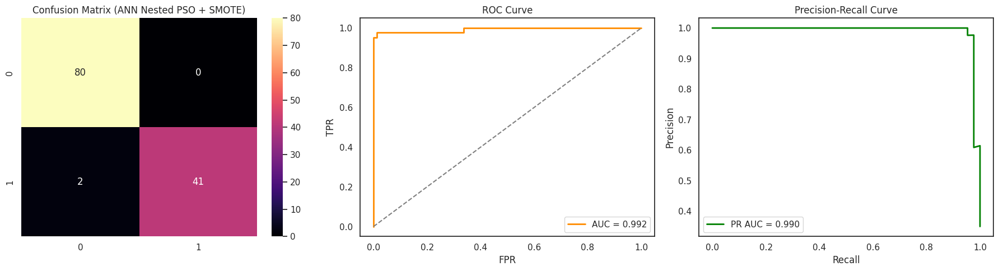


===== ANN Evaluation (Nested PSO + SMOTE) =====
AUC (ROC) : 0.9919
PR-AUC    : 0.9904


,Model,Accuracy(cv),Precision(cv),Recall(cv),F1_score(cv),ROC(cv),Log_Loss(cv),mathew_corrcoef(cv),Accuracy(test),Precision(test),Recall(test),F1_score(test),ROC(test),Log_Loss(test),mathew_corrcoef(test)
0,ANN (Nested Repeated PSO + SMOTE),0.974603,0.970968,0.975871,0.972567,0.998191,0.055413,0.946744,0.98374,0.987805,0.976744,0.981922,0.99186,0.152709,0.964486


In [ ]:
# ============================================================
# REPRODUCIBILITY FIX — must be set BEFORE importing tensorflow
# ============================================================
import os
os.environ['PYTHONHASHSEED'] = '42'
os.environ['TF_DETERMINISTIC_OPS'] = '1'
os.environ['TF_CUDNN_DETERMINISTIC'] = '1'

from pyswarm import pso
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import StratifiedKFold, RepeatedStratifiedKFold
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras import regularizers
from sklearn.metrics import (accuracy_score, precision_score, recall_score, f1_score,
                             roc_auc_score, log_loss, matthews_corrcoef, confusion_matrix,
                             roc_curve, auc, precision_recall_curve)
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

import random
import tensorflow as tf

random.seed(42)
np.random.seed(42)
tf.random.set_seed(42)

# Raw (unscaled) data - scaling will be done per fold
X_train_arr = X_train.values if hasattr(X_train, "values") else X_train
y_train_arr = y_train.values if hasattr(y_train, "values") else y_train
X_test_arr  = X_test.values if hasattr(X_test, "values") else X_test
y_test_arr  = y_test.values if hasattr(y_test, "values") else y_test

# ==========================
# 1. PSO Objective (INNER loop)
# ==========================
def ann_objective(params, X, y):
    neurons1, neurons2, dropout_rate, lr, l2_reg = params
    neurons1, neurons2 = int(neurons1), int(neurons2)
    f1_scores = []

    inner_kf = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)
    smote = SMOTE(random_state=42)

    for train_idx, val_idx in inner_kf.split(X, y):
        X_tr, X_val = X[train_idx], X[val_idx]
        y_tr, y_val = y[train_idx], y[val_idx]

        inner_scaler = StandardScaler()
        X_tr = inner_scaler.fit_transform(X_tr)
        X_val = inner_scaler.transform(X_val)

        try:
            X_tr_res, y_tr_res = smote.fit_resample(X_tr, y_tr)
        except ValueError:
            # too few minority samples in this inner split; skip resampling
            X_tr_res, y_tr_res = X_tr, y_tr

        model = Sequential([
            Dense(neurons1, input_dim=X_tr.shape[1], activation='relu',
                  kernel_regularizer=regularizers.l2(l2_reg)),
            Dropout(dropout_rate),
            Dense(neurons2, activation='relu'),
            Dense(1, activation='sigmoid')
        ])
        model.compile(optimizer=Adam(learning_rate=lr), loss='binary_crossentropy', metrics=['accuracy'])

        model.fit(X_tr_res, y_tr_res, epochs=20, batch_size=16, verbose=0,
                  validation_data=(X_val, y_val),
                  callbacks=[EarlyStopping(patience=5, restore_best_weights=True)])

        y_val_pred_prob = model.predict(X_val, verbose=0)
        y_val_pred = (y_val_pred_prob > 0.5).astype(int)
        f1_scores.append(f1_score(y_val, y_val_pred, average='macro'))

    return -np.mean(f1_scores)

# ==========================
# 2. PSO Bounds
# ==========================
lb = [16, 8, 0.0, 0.0001, 0.0]
ub = [128, 64, 0.5, 0.01, 0.1]

# ============================================================
# PART 1: Nested Repeated Cross-Validation
# ============================================================

N_SPLITS  = 5
N_REPEATS = 2

outer_cv = RepeatedStratifiedKFold(n_splits=N_SPLITS, n_repeats=N_REPEATS, random_state=42)

fold_acc, fold_precision, fold_recall = [], [], []
fold_f1, fold_roc, fold_logloss, fold_mcc = [], [], [], []
best_params_per_fold = []

print(f"Nested Repeated CV: {N_SPLITS} splits x {N_REPEATS} repeats "
      f"= {N_SPLITS*N_REPEATS} outer folds\n")
print("Fold-wise Results (ANN - Nested PSO + SMOTE + fold-wise scaling):\n")

for i, (train_idx, val_idx) in enumerate(outer_cv.split(X_train_arr, y_train_arr), 1):
    X_tr, X_val = X_train_arr[train_idx], X_train_arr[val_idx]
    y_tr, y_val = y_train_arr[train_idx], y_train_arr[val_idx]

    random.seed(42)
    np.random.seed(42)
    tf.random.set_seed(42)

    # ---- INNER: PSO — FIXED unpacking for OptimizeResult (dict-like) ----
    pso_result = pso(
        lambda p: ann_objective(p, X_tr, y_tr),
        lb, ub, swarmsize=5, maxiter=5, debug=False
    )

    best_params = pso_result['x']
    best_score = pso_result['fun']

    neurons1_opt, neurons2_opt, dropout_opt, lr_opt, l2_opt = best_params
    neurons1_opt, neurons2_opt = int(neurons1_opt), int(neurons2_opt)

    best_params_per_fold.append([neurons1_opt, neurons2_opt, dropout_opt, lr_opt, l2_opt])

    print(f"Fold {i} Optimized ANN Params → Neurons1: {neurons1_opt}, Neurons2: {neurons2_opt}, "
          f"Dropout: {dropout_opt:.3f}, LR: {lr_opt:.5f}, L2: {l2_opt:.5f}")

    scaler = StandardScaler()
    X_tr_scaled = scaler.fit_transform(X_tr)
    X_val_scaled = scaler.transform(X_val)

    smote = SMOTE(random_state=42)
    X_tr_res, y_tr_res = smote.fit_resample(X_tr_scaled, y_tr)

    tf.random.set_seed(42)

    model = Sequential([
        Dense(neurons1_opt, input_dim=X_tr_scaled.shape[1], activation='relu',
              kernel_regularizer=regularizers.l2(l2_opt)),
        Dropout(dropout_opt),
        Dense(neurons2_opt, activation='relu'),
        Dense(1, activation='sigmoid')
    ])
    model.compile(optimizer=Adam(learning_rate=lr_opt), loss='binary_crossentropy', metrics=['accuracy'])

    model.fit(X_tr_res, y_tr_res, epochs=100, batch_size=16, verbose=0,
              validation_data=(X_val_scaled, y_val),
              callbacks=[EarlyStopping(patience=10, restore_best_weights=True)])

    y_val_pred_prob = model.predict(X_val_scaled, verbose=0)
    y_val_pred = (y_val_pred_prob > 0.5).astype(int)

    acc  = accuracy_score(y_val, y_val_pred)
    prec = precision_score(y_val, y_val_pred, average='macro')
    rec  = recall_score(y_val, y_val_pred, average='macro')
    f1   = f1_score(y_val, y_val_pred, average='macro')
    roc  = roc_auc_score(y_val, y_val_pred_prob.ravel())
    ll   = log_loss(y_val, y_val_pred_prob)
    mcc  = matthews_corrcoef(y_val, y_val_pred)
    CM_val = confusion_matrix(y_val, y_val_pred)

    fold_acc.append(acc)
    fold_precision.append(prec)
    fold_recall.append(rec)
    fold_f1.append(f1)
    fold_roc.append(roc)
    fold_logloss.append(ll)
    fold_mcc.append(mcc)

    print(f"Fold {i} → Acc:{acc:.3f} | Prec:{prec:.3f} | Recall:{rec:.3f} | "
          f"F1:{f1:.3f} | ROC:{roc:.3f} | LogLoss:{ll:.3f} | MCC:{mcc:.3f}")
    print(f"Confusion Matrix (Fold {i}):\n{CM_val}\n")

print("\n===== Nested Repeated CV — Average Metrics (ANN PSO + SMOTE + fold-wise scaling) =====")
print(f"Accuracy: {np.mean(fold_acc):.4f} ± {np.std(fold_acc):.4f}")
print(f"Precision: {np.mean(fold_precision):.4f} ± {np.std(fold_precision):.4f}")
print(f"Recall: {np.mean(fold_recall):.4f} ± {np.std(fold_recall):.4f}")
print(f"F1: {np.mean(fold_f1):.4f} ± {np.std(fold_f1):.4f}")
print(f"ROC: {np.mean(fold_roc):.4f} ± {np.std(fold_roc):.4f}")
print(f"LogLoss: {np.mean(fold_logloss):.4f} ± {np.std(fold_logloss):.4f}")
print(f"MCC: {np.mean(fold_mcc):.4f} ± {np.std(fold_mcc):.4f}")

# ============================================================
# PART 2: Final deployable model
# ============================================================

random.seed(42)
np.random.seed(42)
tf.random.set_seed(42)

# ---- FINAL PSO — FIXED unpacking for OptimizeResult (dict-like) ----
final_pso_result = pso(
    lambda p: ann_objective(p, X_train_arr, y_train_arr),
    lb, ub, swarmsize=5, maxiter=5, debug=True
)

final_best_params = final_pso_result['x']
final_best_score = final_pso_result['fun']

neurons1_opt, neurons2_opt, dropout_opt, lr_opt, l2_opt = final_best_params
neurons1_opt, neurons2_opt = int(neurons1_opt), int(neurons2_opt)

print(f"\nFinal Optimized ANN Params (full training set) → Neurons1: {neurons1_opt}, "
      f"Neurons2: {neurons2_opt}, Dropout: {dropout_opt:.3f}, LR: {lr_opt:.5f}, L2: {l2_opt:.5f}")

final_scaler = StandardScaler()
X_train_scaled_final = final_scaler.fit_transform(X_train_arr)
X_test_scaled_final  = final_scaler.transform(X_test_arr)

smote_final = SMOTE(random_state=42)
X_train_res, y_train_res = smote_final.fit_resample(X_train_scaled_final, y_train_arr)

tf.random.set_seed(42)

final_model = Sequential([
    Dense(neurons1_opt, input_dim=X_train_scaled_final.shape[1], activation='relu',
          kernel_regularizer=regularizers.l2(l2_opt)),
    Dropout(dropout_opt),
    Dense(neurons2_opt, activation='relu'),
    Dense(1, activation='sigmoid')
])
final_model.compile(optimizer=Adam(learning_rate=lr_opt), loss='binary_crossentropy', metrics=['accuracy'])
final_model.fit(X_train_res, y_train_res, epochs=100, batch_size=16, validation_split=0.1,
                callbacks=[EarlyStopping(patience=10, restore_best_weights=True)], verbose=0)

acc_cv       = np.mean(fold_acc)
precision_cv = np.mean(fold_precision)
recall_cv    = np.mean(fold_recall)
f1_cv        = np.mean(fold_f1)
roc_cv       = np.mean(fold_roc)
logloss_cv   = np.mean(fold_logloss)
mcc_cv       = np.mean(fold_mcc)

y_test_pred_prob = final_model.predict(X_test_scaled_final, verbose=0)
y_test_pred = (y_test_pred_prob > 0.5).astype(int)

acc_test       = accuracy_score(y_test_arr, y_test_pred)
precision_test = precision_score(y_test_arr, y_test_pred, average='macro')
recall_test    = recall_score(y_test_arr, y_test_pred, average='macro')
f1_test        = f1_score(y_test_arr, y_test_pred, average='macro')
roc_test       = roc_auc_score(y_test_arr, y_test_pred_prob.ravel())
logloss_test   = log_loss(y_test_arr, y_test_pred_prob)
mcc_test       = matthews_corrcoef(y_test_arr, y_test_pred)

CM = confusion_matrix(y_test_arr, y_test_pred)
fpr, tpr, _ = roc_curve(y_test_arr, y_test_pred_prob.ravel())
roc_auc_val = auc(fpr, tpr)
precision_vals, recall_vals, _ = precision_recall_curve(y_test_arr, y_test_pred_prob.ravel())
pr_auc = auc(recall_vals, precision_vals)

plt.figure(figsize=(18,5))
plt.subplot(1,3,1)
sns.heatmap(CM, annot=True, fmt='d', cmap='magma')
plt.title("Confusion Matrix (ANN Nested PSO + SMOTE)")

plt.subplot(1,3,2)
plt.plot(fpr, tpr, label=f"AUC = {roc_auc_val:.3f}", color='darkorange', lw=2)
plt.plot([0,1], [0,1], linestyle='--', color='gray')
plt.xlabel("FPR"); plt.ylabel("TPR"); plt.title("ROC Curve"); plt.legend(loc="lower right")

plt.subplot(1,3,3)
plt.plot(recall_vals, precision_vals, label=f"PR AUC = {pr_auc:.3f}", color='green', lw=2)
plt.xlabel("Recall"); plt.ylabel("Precision"); plt.title("Precision-Recall Curve"); plt.legend(loc="lower left")
plt.tight_layout(); plt.show()

print("\n===== ANN Evaluation (Nested PSO + SMOTE) =====")
print(f"AUC (ROC) : {roc_auc_val:.4f}")
print(f"PR-AUC    : {pr_auc:.4f}")

# ============================================================
# PART 3: Append metrics to comparison DataFrame
# ============================================================
r = comp_ev.shape[0]
comp_ev.loc[r] = ['ANN (Nested Repeated PSO + SMOTE)', acc_cv, precision_cv, recall_cv, f1_cv,
                  roc_cv, logloss_cv, mcc_cv, acc_test, precision_test, recall_test, f1_test,
                  roc_test, logloss_test, mcc_test]

comp_ev = comp_ev.sort_values(by='Accuracy(test)', ascending=False).reset_index(drop=True)
comp_ev

# **XAI Model**

# **SHAP**

In [ ]:
!pip install -q shap

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 498.0/498.0 kB 15.1 MB/s eta 0:00:00


In [ ]:
import shap

In [ ]:
# Using the final model and scaled training data as background
explainer = shap.DeepExplainer(final_model, X_train_scaled_final)

/usr/local/lib/python3.13/dist-packages/shap/explainers/_deep/deep_tf.py:94: UserWarning: Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.
  warnings.warn(
/usr/local/lib/python3.13/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: keras_tensor_5560
Received: inputs=['Tensor(shape=(492, 14))']
  warnings.warn(msg)


In [ ]:
# import shap

# # Use a small background set from training data
# background = X_train_scaled_ann[np.random.choice(X_train_scaled_ann.shape[0], 50, replace=False)]

# # KernelExplainer
# explainer = shap.KernelExplainer(final_model.predict, background)

# # Compute SHAP values for test set
# shap_values_binary = explainer.shap_values(X_test_scaled_ann, nsamples=100)  # nsamples can be increased

# # Convert to array
# shap_values_binary = np.array(shap_values_binary)

# # Check shapes
# print("Shape of SHAP values:", shap_values_binary.shape)
# print("Shape of X_test_scaled_ann:", X_test_scaled_ann.shape)

import shap
import numpy as np

# Small background set from final training data
background = X_train_scaled_final[
    np.random.choice(X_train_scaled_final.shape[0], 50, replace=False)
]

# KernelExplainer
explainer = shap.KernelExplainer(
    final_model.predict,
    background
)

# Compute SHAP values
shap_values_binary = explainer.shap_values(
    X_test_scaled_final,
    nsamples=100
)

shap_values_binary = np.array(shap_values_binary)

print("Shape of SHAP values:", shap_values_binary.shape)
print("Shape of X_test_scaled_final:", X_test_scaled_final.shape)

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


  0%|          | 0/123 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 614us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 554us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 591us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 570us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 591us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 580us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 579us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 577us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 566us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 578us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 624us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 572us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 

In [ ]:
shap_values_binary = shap_values_binary.squeeze()

print("New shape:", shap_values_binary.shape)

New shape: (123, 14)


/tmp/ipykernel_4734/32612194.py:3: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values_binary, X_test_scaled_final, feature_names=top_14)


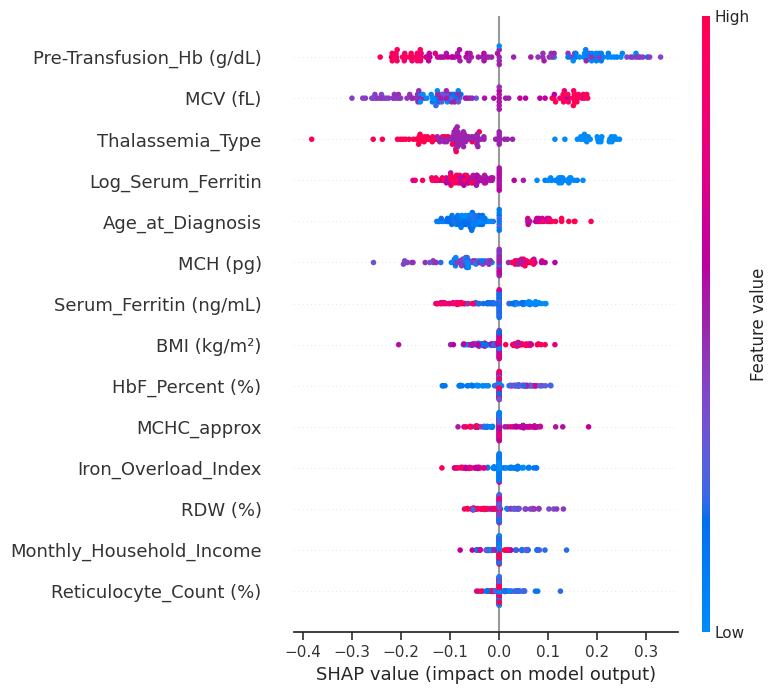

In [ ]:
import shap

shap.summary_plot(shap_values_binary, X_test_scaled_final, feature_names=top_14)

/tmp/ipykernel_4734/987484235.py:1: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(


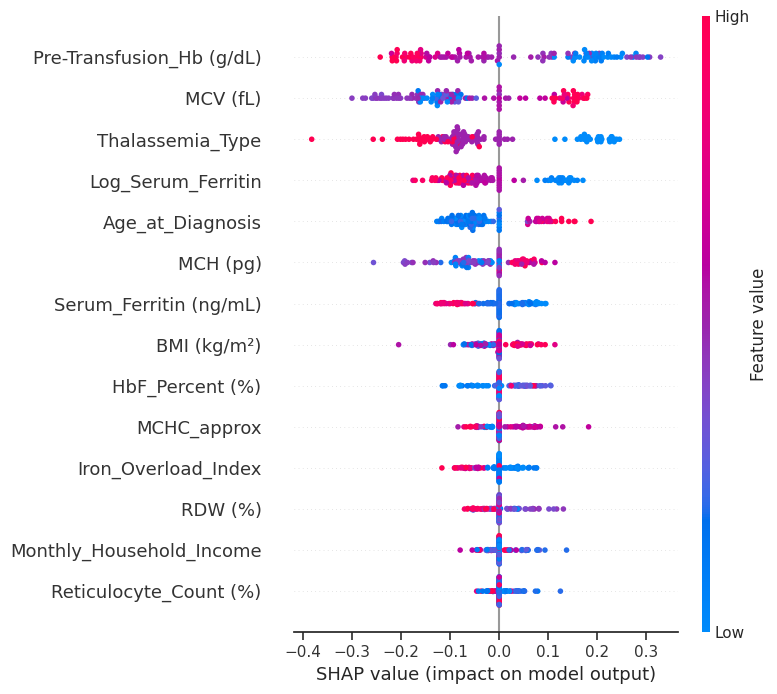

In [ ]:
shap.summary_plot(
    shap_values_binary,
    X_test_scaled_final,
    feature_names=top_14
)

/tmp/ipykernel_4734/349112358.py:1: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(


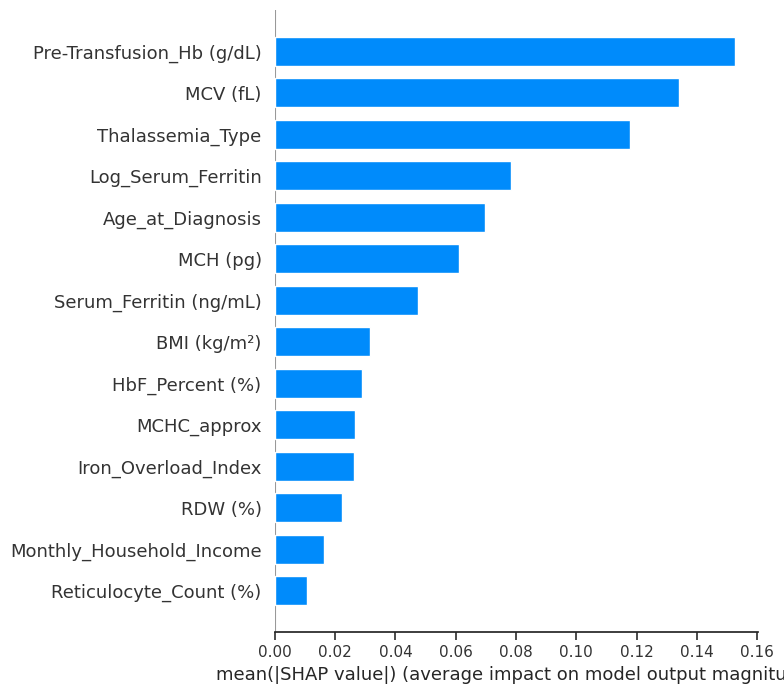

In [ ]:
shap.summary_plot(
    shap_values_binary,
    X_test_scaled_final,
    feature_names=top_14,
    plot_type="bar"
)

In [ ]:
shap.initjs()

shap.force_plot(
    explainer.expected_value,
    shap_values_binary[0, :],
    X_test_scaled_final[0, :],
    feature_names=top_14
)

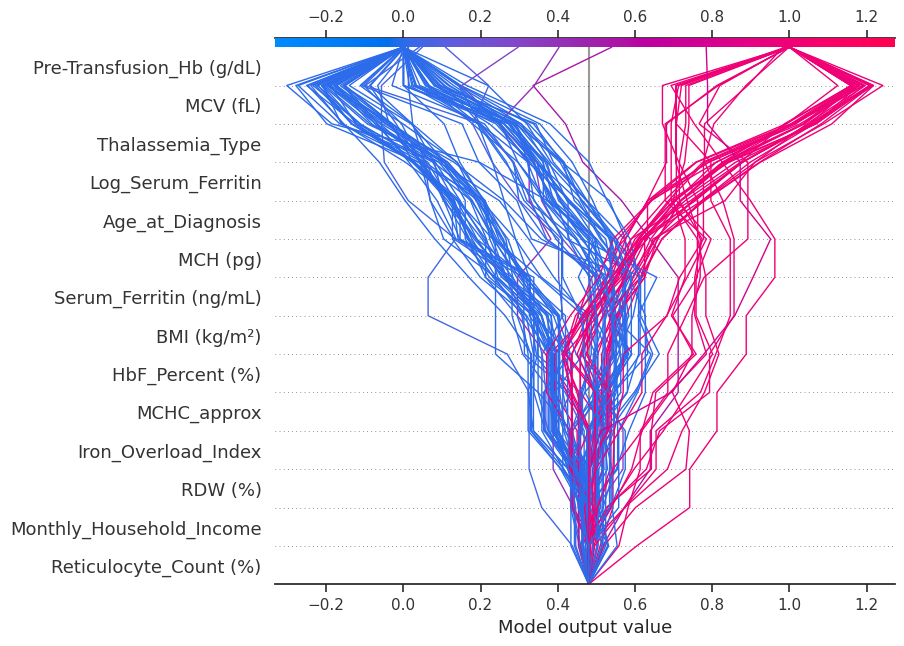

In [ ]:
shap.decision_plot(
    explainer.expected_value,
    shap_values_binary,
    X_test_scaled_final,
    feature_names=top_14
)

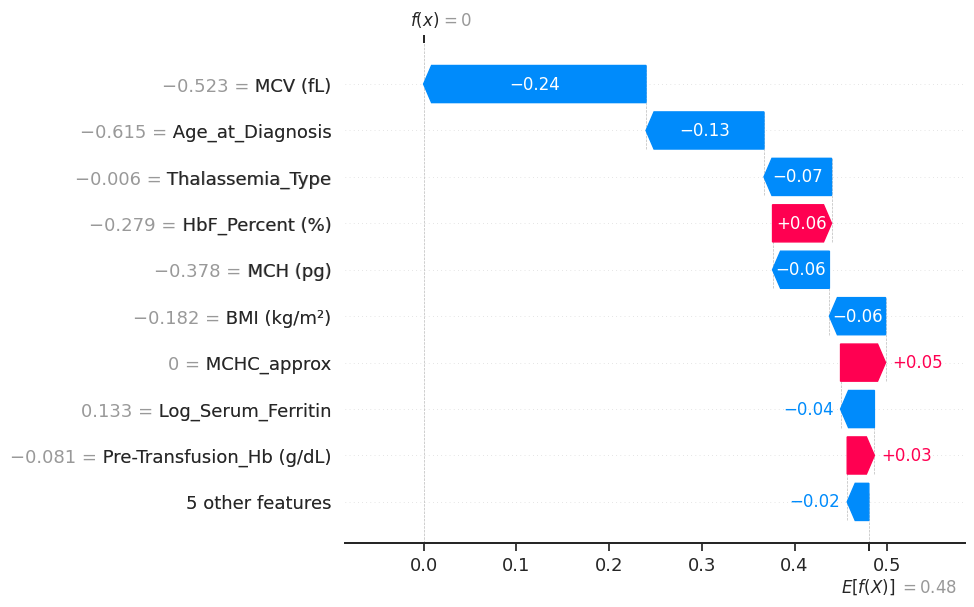

In [ ]:
shap.plots.waterfall(
    shap.Explanation(
        values=shap_values_binary[0, :],
        base_values=explainer.expected_value,
        data=X_test_scaled_final[0, :],
        feature_names=top_14
    )
)

# **LIME**

In [ ]:
pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 7.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=1be229c1a3c42ab4ff7321b32fb50fa57c6d5d34284dda17f43aad60d6273b02
  Stored in directory: /root/.cache/pip/wheels/7c/04/5c/157dc9106512a6c7a30653ec064490c94a49e0fc8f63d19ab9
Successfully built lime


In [ ]:
def ann_predict_proba(x):
    # x: NumPy array of shape (num_samples, num_features)
    return np.hstack([1 - final_model.predict(x), final_model.predict(x)])

In [ ]:
from lime import lime_tabular

lime_explainer = lime_tabular.LimeTabularExplainer(
    training_data=X_train_scaled_final,          # NumPy array
    feature_names=top_14,                      # 14 features
    class_names=['No', 'Yes'],                 # binary labels
    mode='classification'
)

157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 580us/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 564us/step


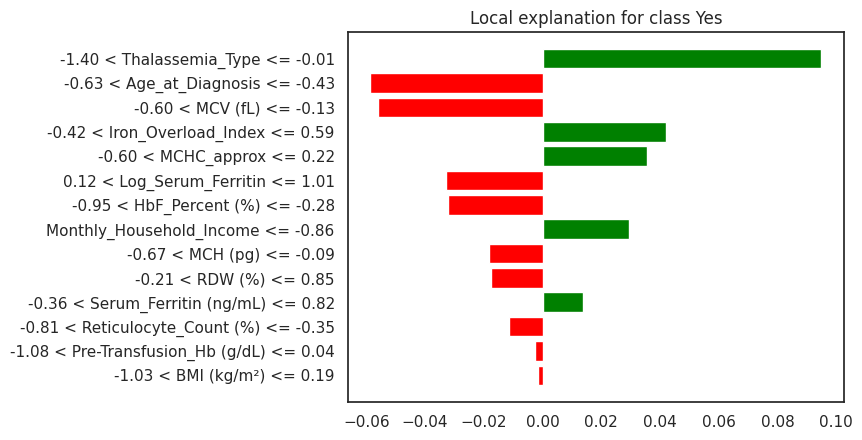

In [ ]:
#Sclaed values

i = 0  # index of test sample you want to explain

explanation = lime_explainer.explain_instance(
    data_row=X_test_scaled_final[i],           # test sample as NumPy array
    predict_fn=ann_predict_proba,           # custom predict function
    num_features=14                          # how many features to show
)

# Show in notebook
explanation.show_in_notebook(show_table=True, show_all=False)

# Or as a matplotlib figure
fig = explanation.as_pyplot_figure()
fig.show()

In [ ]:
data_row = X_test.iloc[i].values   # shape: (14,)

In [ ]:
def ann_predict_proba_unscaled(x_unscaled):
    """
    x_unscaled: NumPy array of shape (num_samples, num_features)
    """
    x_scaled = scaler.transform(x_unscaled)          # scale to match ANN
    pred_class1 = final_model.predict(x_scaled, verbose=0)
    return np.hstack([1 - pred_class1, pred_class1])

In [ ]:
#unscaled data

from lime import lime_tabular

lime_explainer = lime_tabular.LimeTabularExplainer(
    training_data=X_train.values,    # unscaled
    feature_names=top_14,
    class_names=['Bad', 'Good'],
    mode='classification'
)

i = 0  # test sample index
explanation = lime_explainer.explain_instance(
    data_row=X_test.iloc[i].values,   # <-- 1D array, shape (14,)
    predict_fn=ann_predict_proba_unscaled,
    num_features=14
)

# Show explanations
explanation.show_in_notebook(show_table=True)